# Module0-DSLR

## Imports

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', None)

from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, precision_score
from sklearn.metrics import recall_score, f1_score
from sklearn.decomposition import PCA
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
from statsmodels.tools.tools import add_constant
from sklearn.preprocessing import OneHotEncoder

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

from sklearn.compose import ColumnTransformer

from sklearn.model_selection import GridSearchCV
from sklearn.multiclass import OneVsRestClassifier

import joblib

%matplotlib inline

In [2]:
!pwd

/Users/admin/code/42/4-Spe_DS-AI/module0-dslr


In [3]:
df_train = pd.read_csv('datasets/dataset_train.csv', sep = ',', header=0).drop(columns=['Index'])
df_train.head()

,Hogwarts House,First Name,Last Name,Birthday,Best Hand,Arithmancy,Astronomy,Herbology,Defense Against the Dark Arts,Divination,Muggle Studies,Ancient Runes,History of Magic,Transfiguration,Potions,Care of Magical Creatures,Charms,Flying
0,Ravenclaw,Tamara,Hsu,2000-03-30,Left,58384.0,-487.886086,5.727180,4.878861,4.722,272.035831,532.484226,5.231058,1039.788281,3.790369,0.715939,-232.79405,-26.89
1,Slytherin,Erich,Paredes,1999-10-14,Right,67239.0,-552.060507,-5.987446,5.520605,-5.612,-487.340557,367.760303,4.107170,1058.944592,7.248742,0.091674,-252.18425,-113.45
2,Ravenclaw,Stephany,Braun,1999-11-03,Left,23702.0,-366.076117,7.725017,3.660761,6.140,664.893521,602.585284,3.555579,1088.088348,8.728531,-0.515327,-227.34265,30.42
3,Gryffindor,Vesta,Mcmichael,2000-08-19,Left,32667.0,697.742809,-6.497214,-6.977428,4.026,-537.001128,523.982133,-4.809637,920.391449,0.821911,-0.014040,-256.84675,200.64
4,Gryffindor,Gaston,Gibbs,1998-09-27,Left,60158.0,436.775204,-7.820623,NaN,2.236,-444.262537,599.324514,-3.444377,937.434724,4.311066,-0.264070,-256.38730,157.98


In [4]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1600 entries, 0 to 1599
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Hogwarts House                 1600 non-null   object 
 1   First Name                     1600 non-null   object 
 2   Last Name                      1600 non-null   object 
 3   Birthday                       1600 non-null   object 
 4   Best Hand                      1600 non-null   object 
 5   Arithmancy                     1566 non-null   float64
 6   Astronomy                      1568 non-null   float64
 7   Herbology                      1567 non-null   float64
 8   Defense Against the Dark Arts  1569 non-null   float64
 9   Divination                     1561 non-null   float64
 10  Muggle Studies                 1565 non-null   float64
 11  Ancient Runes                  1565 non-null   float64
 12  History of Magic               1557 non-null   f

In [5]:
print("faudra onehot-encoder 'Best Hand' ? =>>>> NNNOOONNN")

faudra onehot-encoder 'Best Hand' ? =>>>> NNNOOONNN


In [6]:
# Instantiate the OneHotEncoder
#ohe = OneHotEncoder(handle_unknown = 'ignore', drop="first", sparse_output=False) 

# Fit encoder
#ohe.fit(df_train[['Best Hand']]) 

#df_train[ohe.get_feature_names_out()] = ohe.transform(df_train[['Best Hand']])

# Drop the column "Street" which has been encoded
#df_train.drop(columns = ["Best Hand"], inplace = True)

# Show the dataset
#df_train.head(3)

## Data Analysis

In [7]:
print("fonctions provenant de 2-PISCINE_PYTHON_FOR_DSmodule4/ex00")

fonctions provenant de 2-PISCINE_PYTHON_FOR_DSmodule4/ex00


In [8]:
#!/usr/bin/env python3
import sys

def ft_clean(list_nombre_temp):

    df_temp = pd.DataFrame(list_nombre_temp).dropna()
    # print(df_temp)
    return list(df_temp[0])


def tri_bulle(list_nombre):
    """sort"""

    list_nombre = ft_clean(list_nombre)
    
    n = len(list_nombre)
    for i in range(n):
        for j in range(n - 1):
            if list_nombre[j] > list_nombre[j + 1]:
                temp = list_nombre[j]
                list_nombre[j] = list_nombre[j + 1]
                list_nombre[j + 1] = temp

    return list_nombre


def ft_count(list_nombre):
    """return mean"""

    list_nombre = ft_clean(list_nombre)
    res = len(list_nombre)

    # On met en sourdine
    # print(f"{sys._getframe(  ).f_code.co_name}: {(res)}")
    
    return res
    

def ft_min(list_nombre):
    """return mean"""

    list_nombre = ft_clean(list_nombre)
    # res = min(list_nombre) Pas le droit a cette fonction

    res = 0
    for i, nb in enumerate(list_nombre):
        if i == 0:
            res = nb
        elif res > nb:
            res = nb
            
    # On met en sourdine
    # print(f"{sys._getframe(  ).f_code.co_name}: {(res)}")
    
    return res


def ft_max(list_nombre):
    """return mean"""

    list_nombre = ft_clean(list_nombre)
    # res = max(list_nombre)

    res = 0
    for i, nb in enumerate(list_nombre):
        if i == 0:
            res = nb
        elif res < nb:
            res = nb

    # On met en sourdine
    # print(f"{sys._getframe(  ).f_code.co_name}: {(res)}")
    
    return res


def ft_mean(list_nombre):
    """return mean"""

    list_nombre = ft_clean(list_nombre)
    
    n = len(list_nombre)
    res = sum(x for x in list_nombre) / n
    
    # On met en sourdine
    # print(f"{sys._getframe(  ).f_code.co_name}: {res}")
    
    return res


def ft_var(list_nombre, print_yn=1):
    """return var"""

    list_nombre = ft_clean(list_nombre)
    
    n = len(list_nombre)
    moy = sum(x for x in list_nombre) / n
    res = sum((x - moy)**2 for x in list_nombre) / n

    # On met en sourdine
    # if (print_yn == 1):
    #     print(f"{sys._getframe(  ).f_code.co_name}: {res}")

    return res


def ft_std(list_nombre):
    """return std"""

    list_nombre = ft_clean(list_nombre)
    
    res = ft_var(list_nombre, 0)
    res = res**0.5
    
    # On met en sourdine
    #print(f"{sys._getframe(  ).f_code.co_name}: {res}")

    return res


def ft_median(list_nombre, print_yn=1):
    """return median"""

    list_nombre = ft_clean(list_nombre)
    
    n = len(list_nombre)
    if n == 1:
        position = 0
        mediane = list_nombre[position]

    else:
        list_nombre = tri_bulle(list_nombre)
        # print(f"liste triee: {list_nombre}")

        if n % 2 == 0:
            position = int(n / 2) - 1
            mediane = (list_nombre[position] + list_nombre[position + 1]) / 2

        else:
            position = int(n // 2)
            mediane = list_nombre[position]

    # On met en sourdine
    # if (print_yn == 1):
    #     print(f"{sys._getframe(  ).f_code.co_name}: {mediane}")

    return (mediane, position)


def ft_quartile(list_nombre):
    """return Quartile"""

    list_nombre = ft_clean(list_nombre)
    
    n = len(list_nombre)
    if n <= 3:
        res = "not enough elements in list"

    else:
        list_nombre = tri_bulle(list_nombre)
        position = ft_median(list_nombre, 0)[1]
        left = list_nombre[:position + 1]
        right = list_nombre[position:]
        position1 = ft_median(left, 0)[1]
        position2 = ft_median(right, 0)[1]
        res = []
        res.append(float(left[position1]))
        res.append(float(right[position2]))

    # On met en sourdine
    # print(f"{sys._getframe(  ).f_code.co_name}: {(res)}")

    return res


def ft_statistics(list_nombre, **kwargs):
    """Handles error and return statistics provided in **kwargs"""

    list_methode = list(kwargs.values())
    valid_methods = ["count", "mean", "std", "var", "median", "quartile", "ft_count", "ft_min", "ft_max"]

    try:
        assert len(list_methode) > 0, "method list is empty"
        assert isinstance(list_nombre, list), "argument must be a list"
        assert len(list_nombre) > 0, "list is empty"

        # Vérifie que tous les éléments sont numériques
        for x in list_nombre:
            assert isinstance(x, (int, float)), "non numeric value in list"

        for method in list_methode:
            if method in valid_methods:
                globals()[method](list_nombre)
            else:
                print("ERROR")

    except AssertionError:
        for _ in list_methode:
            print("ERROR")
        return


In [9]:
import pandas as pd

def ft_describe(df_temp):
    """Equivalent à df.describe() mais avec vos fonctions ft_"""
    
    df_temp = df_temp.select_dtypes(include=['int64', 'float'])
    df_temp = df_temp.dropna()
    
    stats_names = ["count", "mean", "std", "min", "25%", "50%", "75%", "max"]
    result_dict = {stat: [] for stat in stats_names}
    
    for c in df_temp.columns:
        col = list(df_temp[c])
        
        # clean
        col_clean = ft_clean(col)
        
        # Stats
        count_val = ft_count(col_clean)
        mean_val = ft_mean(col_clean)
        std_val = ft_std(col_clean)
        min_val = ft_min(col_clean)
        max_val = ft_max(col_clean)
        q25, q75 = ft_quartile(col_clean)  # quartile renvoie [25%, 75%]
        median_val = ft_median(col_clean)[0]
        
        # append
        result_dict["count"].append(count_val)
        result_dict["mean"].append(mean_val)
        result_dict["std"].append(std_val)
        result_dict["min"].append(min_val)
        result_dict["25%"].append(q25)
        result_dict["50%"].append(median_val)
        result_dict["75%"].append(q75)
        result_dict["max"].append(max_val)
    
    describe_df = pd.DataFrame(result_dict, index=df_temp.columns).T
    return describe_df

In [10]:
ft_describe(df_train)

,Arithmancy,Astronomy,Herbology,Defense Against the Dark Arts,Divination,Muggle Studies,Ancient Runes,History of Magic,Transfiguration,Potions,Care of Magical Creatures,Charms,Flying
count,1251.000000,1251.000000,1251.000000,1251.000000,1251.000000,1251.000000,1251.000000,1251.000000,1251.000000,1251.000000,1251.000000,1251.000000,1251.000000
mean,49453.109512,46.476449,1.189457,-0.464764,3.213831,-222.903666,496.251457,2.978593,1029.862868,5.961276,-0.064315,-243.325723,23.109009
std,16694.876442,520.737840,5.221049,5.207378,4.109348,484.791972,106.667952,4.455181,43.965295,3.101678,0.972258,8.786891,97.715938
min,-24370.000000,-966.740546,-10.295663,-10.162119,-8.727000,-1043.961527,283.869609,-8.431117,906.627320,-3.620762,-3.313676,-261.048920,-181.470000
25%,38144.000000,-485.396284,-4.261209,-5.284489,3.103000,-574.119995,396.323152,2.223745,1025.523985,3.677991,-0.695185,-250.586360,-40.090000
50%,48793.000000,272.071636,3.526427,-2.720716,4.621000,-419.164294,464.327598,4.402631,1045.480657,5.868537,-0.065116,-244.789150,-1.920000
75%,60761.000000,528.243162,5.461871,4.852497,5.725000,263.676178,597.329744,5.893858,1058.326504,8.206382,0.575569,-232.531930,52.620000
max,104956.000000,1016.211940,10.296759,9.667405,10.032000,1092.388611,745.396220,11.889713,1094.460614,13.536762,3.056546,-225.428140,279.070000


## Data Visualization

### Histogram

In [11]:
df_temp = df_train.select_dtypes(include=['int64', 'float'])
df_temp

,Arithmancy,Astronomy,Herbology,Defense Against the Dark Arts,Divination,Muggle Studies,Ancient Runes,History of Magic,Transfiguration,Potions,Care of Magical Creatures,Charms,Flying
0,58384.0,-487.886086,5.727180,4.878861,4.722,272.035831,532.484226,5.231058,1039.788281,3.790369,0.715939,-232.79405,-26.89
1,67239.0,-552.060507,-5.987446,5.520605,-5.612,-487.340557,367.760303,4.107170,1058.944592,7.248742,0.091674,-252.18425,-113.45
2,23702.0,-366.076117,7.725017,3.660761,6.140,664.893521,602.585284,3.555579,1088.088348,8.728531,-0.515327,-227.34265,30.42
3,32667.0,697.742809,-6.497214,-6.977428,4.026,-537.001128,523.982133,-4.809637,920.391449,0.821911,-0.014040,-256.84675,200.64
4,60158.0,436.775204,-7.820623,NaN,2.236,-444.262537,599.324514,-3.444377,937.434724,4.311066,-0.264070,-256.38730,157.98
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1595,49009.0,354.280086,-4.541837,-3.542801,5.702,-497.235066,618.220213,-5.231721,964.219853,3.389086,-0.649983,-250.39401,185.83
1596,63296.0,367.531174,6.061064,-3.675312,1.757,-643.271092,445.827565,2.238112,1056.147366,5.825263,-0.333962,-246.42719,44.80
1597,63905.0,544.018925,-3.203269,-5.440189,6.065,-385.150457,635.211486,-5.984257,953.866685,1.709808,0.071569,-251.63679,198.47
1598,82713.0,453.676219,3.442831,-4.536762,6.738,-831.741123,383.444937,3.813111,1087.949205,3.904100,-0.531875,-246.19072,-76.81


#### Histogram all :

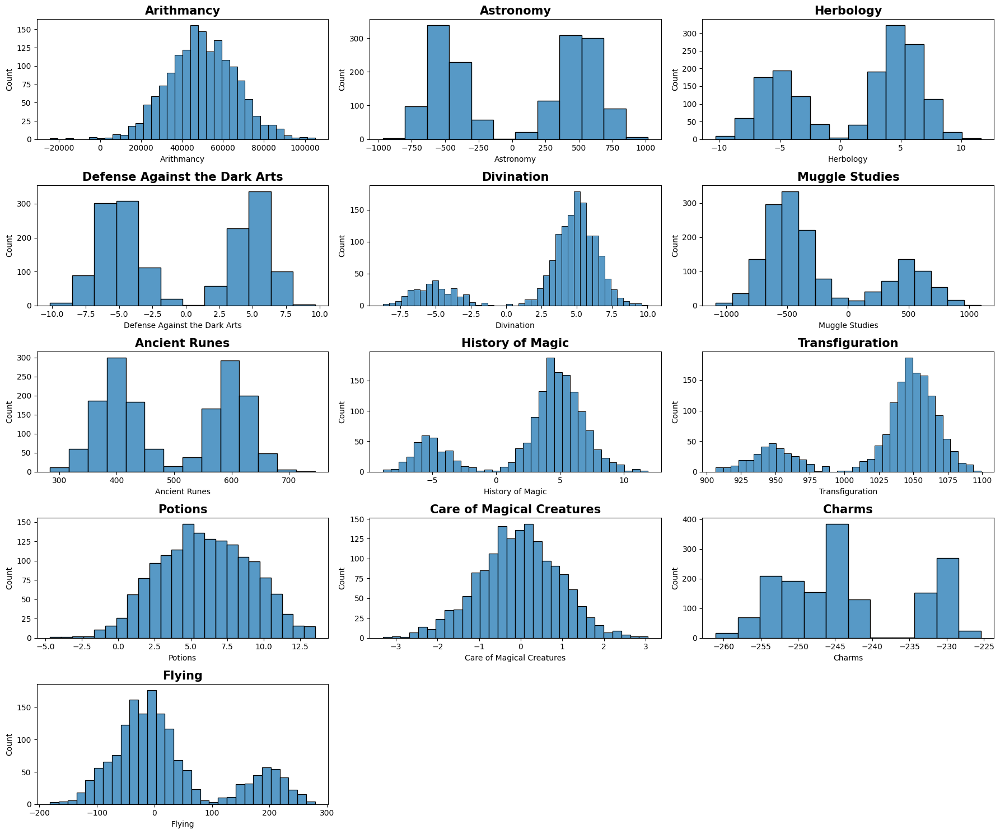

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Liste des colonnes numériques
col_shortl = [col for col in df_temp.columns if df_temp[col].dtype in ['float64', 'int64']]

# Paramètres
nb_col = 3
nb_lignes = math.ceil(len(col_shortl) / nb_col)

# Création de la figure globale
plt.figure(figsize=(6*nb_col, 3*nb_lignes))

for i, col in enumerate(col_shortl):
    plt.subplot(nb_lignes, nb_col, i+1)
    sns.histplot(df_temp[col])
    plt.title(col, fontdict={'fontsize': 15, 'fontweight': 'bold'})

plt.tight_layout()
plt.show()

#### Histogram per house, VISUEL

In [13]:
houses = list(df_train['Hogwarts House'].unique())
houses

['Ravenclaw', 'Slytherin', 'Gryffindor', 'Hufflepuff']

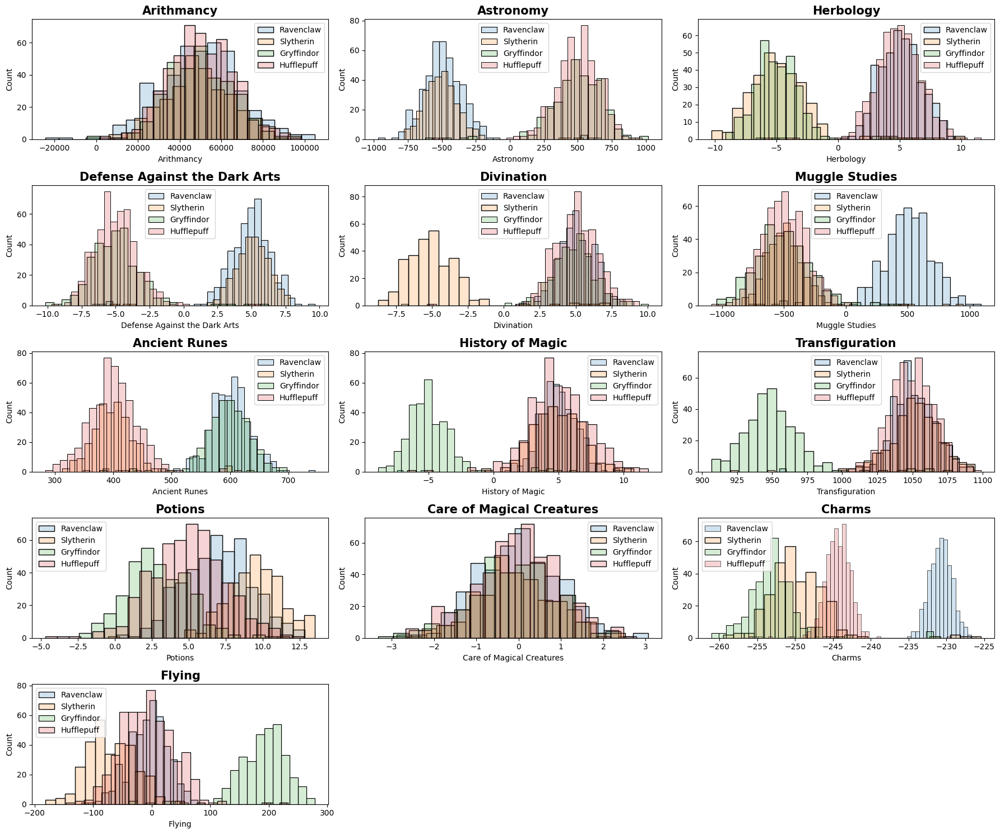

In [14]:
# Liste des colonnes numériques
col_shortl = [col for col in df_train.columns if df_train[col].dtype in ['float64', 'int64']]

# Paramètres
nb_col = 3
nb_lignes = math.ceil(len(col_shortl) / nb_col)

# Création de la figure globale
plt.figure(figsize=(6*nb_col, 3 * nb_lignes))

for i, col in enumerate(col_shortl):
    plt.subplot(nb_lignes, nb_col, i+1)
    for house in houses:
        sns.histplot(df_train[df_train['Hogwarts House'] == house][col], alpha = 0.2, label=house)
    plt.title(col, fontdict={'fontsize': 15, 'fontweight': 'bold'})
    plt.legend(houses)
plt.tight_layout()
plt.show()

#### Check homogeneite entre les differentes maison pour chaque matiere <=> check moyennnes les plus proches

In [15]:
df_train_average_per_house = df_train.groupby("Hogwarts House")[col_shortl].mean()
df_train_average_per_house

,Arithmancy,Astronomy,Herbology,Defense Against the Dark Arts,Divination,Muggle Studies,Ancient Runes,History of Magic,Transfiguration,Potions,Care of Magical Creatures,Charms,Flying
Hogwarts House,,,,,,,,,,,,,
Gryffindor,49121.996855,493.336646,-4.783906,-4.948000,4.901349,-501.483149,596.934487,-4.814947,951.134696,2.938132,-0.139186,-252.731046,189.024526
Hufflepuff,50249.040230,497.708002,4.919408,-4.981666,5.021665,-498.350774,400.147454,5.010295,1049.562165,4.960686,-0.028449,-244.347364,-7.085690
Ravenclaw,49446.345708,-480.043083,5.021857,4.818088,4.987894,489.111967,597.749968,4.915960,1050.334282,6.972413,0.003899,-231.080576,-3.979797
Slytherin,49374.806780,-496.333927,-4.775624,4.964016,-4.814491,-478.731883,401.813874,4.967681,1051.898698,9.470743,-0.087348,-249.593194,-70.321661


In [16]:
df_train_average_per_house["Arithmancy"].min()

49121.99685534591

In [17]:
df_train_average_per_house["Arithmancy"].max()

50249.04022988506

In [18]:
houses

['Ravenclaw', 'Slytherin', 'Gryffindor', 'Hufflepuff']

In [19]:
courses = list(df_train_average_per_house.columns)
courses

['Arithmancy',
 'Astronomy',
 'Herbology',
 'Defense Against the Dark Arts',
 'Divination',
 'Muggle Studies',
 'Ancient Runes',
 'History of Magic',
 'Transfiguration',
 'Potions',
 'Care of Magical Creatures',
 'Charms',
 'Flying']

In [20]:
df_train_average_per_house = df_train.groupby("Hogwarts House")[col_shortl].mean()

ecarts = df_train_average_per_house.max() - df_train_average_per_house.min()

ecarts_df = ecarts.sort_values().to_frame(name="ecart")
ecarts_df

,ecart
Care of Magical Creatures,0.143085
Potions,6.532611
Herbology,9.805763
History of Magic,9.825242
Divination,9.836156
Defense Against the Dark Arts,9.945682
Charms,21.650469
Transfiguration,100.764002
Ancient Runes,197.602514
Flying,259.346187


In [21]:
print("ecart brut pas suffisant !!! \n" * 3)

ecart brut pas suffisant !!! 
ecart brut pas suffisant !!! 
ecart brut pas suffisant !!! 



In [22]:
print("On va regarder en relatif cad en % \n" * 3)

On va regarder en relatif cad en % 
On va regarder en relatif cad en % 
On va regarder en relatif cad en % 



In [23]:
# On va regarder en relatif cad en %

df_mean = df_train.groupby("Hogwarts House")[col_shortl].mean()

ecarts = df_mean.max() - df_mean.min()

global_mean = df_train[col_shortl].mean()

ecart_relatif_absolue = abs(ecarts / global_mean)

ecart_relatif_absolue.sort_values()

Arithmancy                        0.022707
Charms                            0.088960
Transfiguration                   0.097820
Ancient Runes                     0.398595
Potions                           1.097849
Care of Magical Creatures         2.678133
Divination                        3.118718
History of Magic                  3.315872
Muggle Studies                    4.410684
Herbology                         8.593861
Flying                           11.811005
Astronomy                        24.977728
Defense Against the Dark Arts    25.642223
dtype: float64

In [24]:
print("REPONSE : Arithmancy CQFD\n" * 3)

REPONSE : Arithmancy CQFD
REPONSE : Arithmancy CQFD
REPONSE : Arithmancy CQFD



### Scatter Plot

In [25]:
def scatter_plot(my_df):

    cols = my_df.select_dtypes(include=["int64", "float64"]).columns
    
    corr_matrix = my_df[cols].corr()
    
    for i in range(len(cols)):
        for j in range(i+1, len(cols)):
            r = corr_matrix.iloc[i, j]
            if abs(r) > 0.999:
                print(f"{cols[i]} vs {cols[j]}, correl= {round(r, 3)})")
                print("-" * 50)
                plt.figure(figsize=(5, 7))
                sns.scatterplot(x=cols[i], y=cols[j], data=my_df, s=10, hue="Hogwarts House")
                plt.show();

    return
            

Astronomy vs Defense Against the Dark Arts, correl= -1.0)
--------------------------------------------------


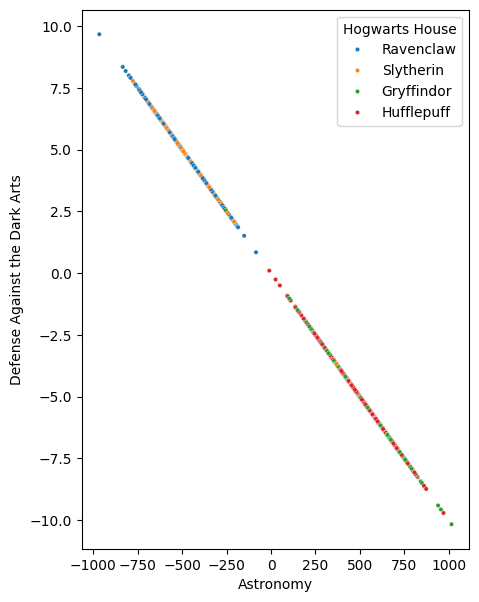

In [26]:
scatter_plot(df_train)

In [27]:
print("CQFD\n" *3)

CQFD
CQFD
CQFD



### Pairplot

In [28]:
def ft_pair_plot(my_df):

    # Liste des colonnes numériques
    col_shortl = [col for col in my_df.columns if my_df[col].dtype in ['float64', 'int64']]
    houses = my_df['Hogwarts House'].unique()
    
    n = len(col_shortl)
    plt.figure(figsize=(3*n, 3*n))
    
    for i, col_x in enumerate(col_shortl):
        for j, col_y in enumerate(col_shortl):
            
            if col_x != col_y:
                plt.subplot(n, n, j*n + i + 1)
                sns.scatterplot(x=col_x, y=col_y, data=my_df, s=10, hue="Hogwarts House")
                plt.xticks([])
                plt.yticks([])
        
                sns.regplot(
                    x=col_x,
                    y=col_y,
                    data=my_df,
                    scatter=False,
                    color="black",
                    line_kws={"linewidth": 1})
        
                plt.xticks([])
                plt.yticks([])
    
            else:
                plt.subplot(n, n, j*n + i + 1)
                for house in houses:
                    sns.histplot(my_df[my_df['Hogwarts House'] == house][col_x], alpha = 0.2, label=house)
                plt.title(col_x, fontdict={'fontsize': 15, 'fontweight': 'bold'})
                
    
    plt.tight_layout()
    plt.show()

    return

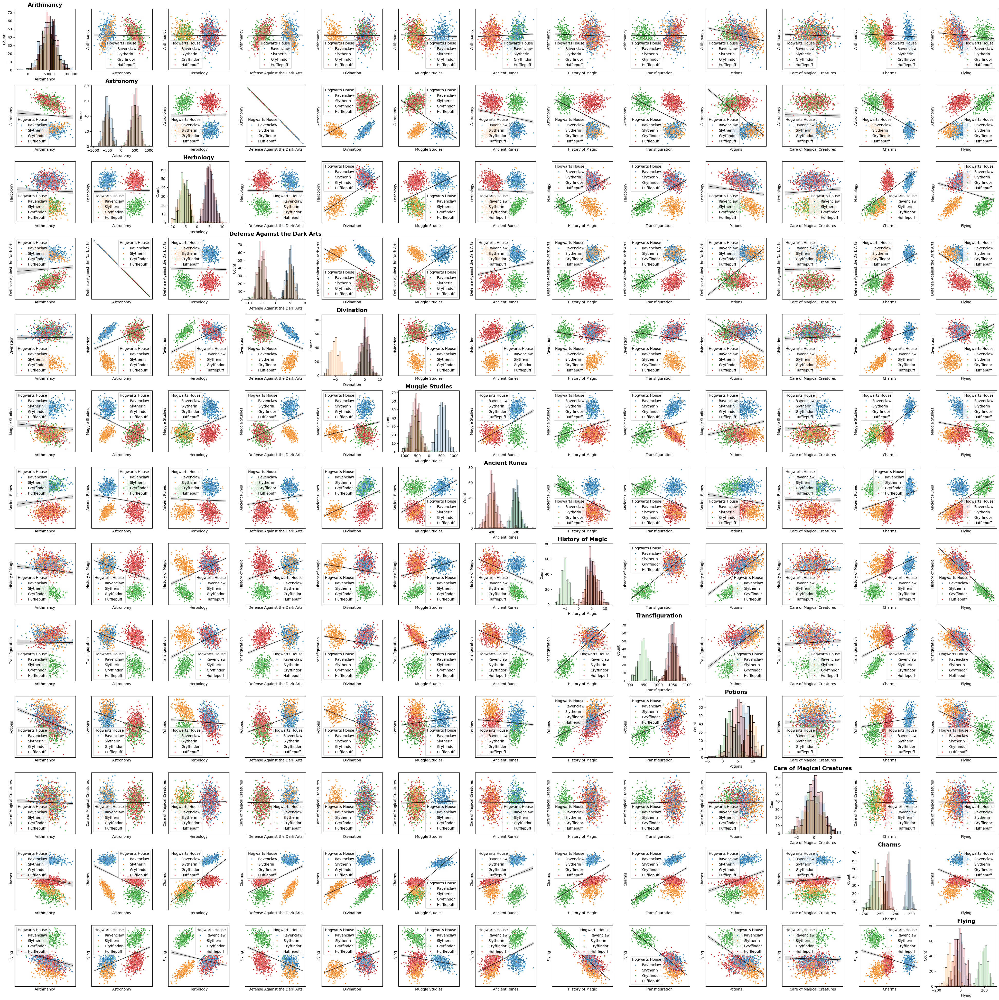

In [29]:
ft_pair_plot(df_train)

In [30]:
print("CQFD\n" *3)

CQFD
CQFD
CQFD



In [31]:
print("On va aussi regarder la correl sur le dataset entre les features \n" *3)

On va aussi regarder la correl sur le dataset entre les features 
On va aussi regarder la correl sur le dataset entre les features 
On va aussi regarder la correl sur le dataset entre les features 



### Option : Correlation, VIF

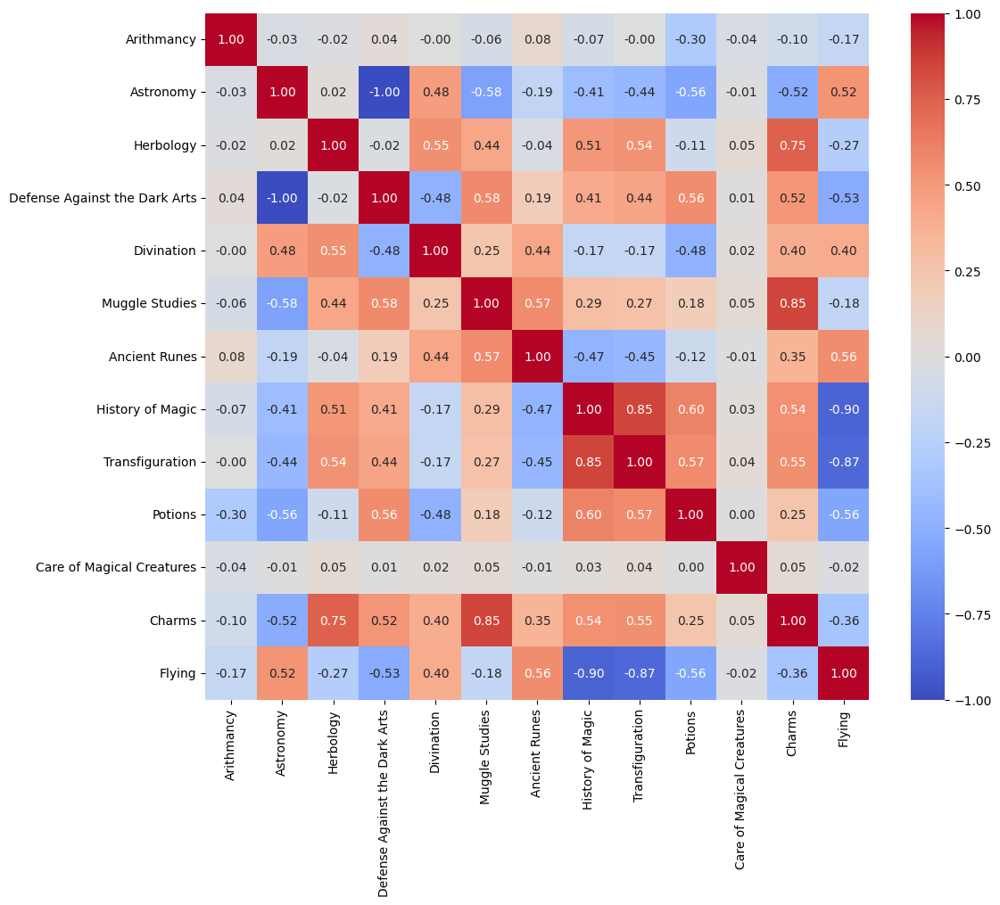

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

col_shortl = [col for col in df_train.columns if df_train[col].dtype in ['float64', 'int64']]

corr = df_train[col_shortl].corr()

plt.figure(figsize=(12, 10))

sns.heatmap(
    corr,
    cmap='coolwarm',
    vmin=-1,
    vmax=1,
    annot=True,
    fmt=".2f"
)

plt.show()

In [33]:
print("** Rappel: Astronomy vs Defense Against the Dark Arts, correl= -1.0) **\n" *3)

** Rappel: Astronomy vs Defense Against the Dark Arts, correl= -1.0) **
** Rappel: Astronomy vs Defense Against the Dark Arts, correl= -1.0) **
** Rappel: Astronomy vs Defense Against the Dark Arts, correl= -1.0) **



#### shortlist des colonnes permettant de diminuer la Multi-colinearite

In [34]:
# On doit tout d'abord scaler la data
stand_scaler = StandardScaler()
df_temp = df_train[col_shortl].copy()
df_temp = df_temp.dropna()
df_temp_scaled = pd.DataFrame(stand_scaler.fit_transform(df_temp))
df_temp_scaled.columns = col_shortl
df_temp_scaled.head()

,Arithmancy,Astronomy,Herbology,Defense Against the Dark Arts,Divination,Muggle Studies,Ancient Runes,History of Magic,Transfiguration,Potions,Care of Magical Creatures,Charms,Flying
0,0.534948,-1.026164,0.869121,1.026164,0.367009,1.020932,0.339678,0.505583,0.225756,-0.699914,0.802518,1.198566,-0.511677
1,1.065350,-1.149402,-1.374609,1.149402,-2.147745,-0.545465,-1.204590,0.253318,0.661470,0.415087,0.160441,-1.008153,-1.397510
2,-1.542456,-0.792246,1.251771,0.792246,0.712076,1.831295,0.996868,0.129509,1.324351,0.892180,-0.463881,1.818968,0.074819
3,-1.005465,1.250661,-1.472247,-1.250661,0.197639,-0.647902,0.259972,-1.748129,-2.489951,-1.656963,0.051710,-1.538773,1.816807
4,-1.691783,-1.267747,-1.049340,1.267747,-2.386225,-0.449871,-0.937954,0.539078,0.522737,1.866711,1.146002,-0.525757,-0.591500


In [35]:
# On commence avec toutes les features
col_vif = col_shortl.copy()

while True:

    # On ajoute la constante
    X = add_constant(
        df_temp_scaled[col_vif],
        has_constant="add"
    )

    # Calcul des VIF
    df_VIF = pd.DataFrame({
        "feature": X.columns,
        "vif_index": [
            vif(X.values, i)
            for i in range(X.shape[1])
        ]
    })

    # On ignore la constante, sert juste a avoir des calculs corrects
    df_VIF_no_const = df_VIF[df_VIF.feature != "const"]

    # On cherche la feature avec le VIF maximum
    index_max = df_VIF_no_const["vif_index"].idxmax()

    max_vif = df_VIF_no_const.loc[index_max, "vif_index"]
    feature_max = df_VIF_no_const.loc[index_max, "feature"]

    # Tous les VIF sont maintenant < 5
    if max_vif < 5:
        break

    print(f"delete de {feature_max} "f"avec VIF = {max_vif:.2f}")

    # On ne supprime QUE la pire feature
    col_vif.remove(feature_max)
    


delete de Astronomy avec VIF = inf
delete de Charms avec VIF = 39640175574.50
delete de Flying avec VIF = 1159547063.77
delete de Ancient Runes avec VIF = 883384650.12
delete de Herbology avec VIF = 6.10


/Users/admin/.pyenv/versions/3.12.9/envs/lewagon_current/lib/python3.12/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


In [36]:
col_vif, len(col_vif), len(col_shortl)

(['Arithmancy',
  'Defense Against the Dark Arts',
  'Divination',
  'Muggle Studies',
  'History of Magic',
  'Transfiguration',
  'Potions',
  'Care of Magical Creatures'],
 8,
 13)

In [37]:
print("** PB de MULTICOLINEARITE => soit on fait une regression Logistique avec les 8 colonnes de 'col_vif' soit PCA (en gardant toutes les features) qui va par construction virer la colinearité **\n" *3)

** PB de MULTICOLINEARITE => soit on fait une regression Logistique avec les 8 colonnes de 'col_vif' soit PCA (en gardant toutes les features) qui va par construction virer la colinearité **
** PB de MULTICOLINEARITE => soit on fait une regression Logistique avec les 8 colonnes de 'col_vif' soit PCA (en gardant toutes les features) qui va par construction virer la colinearité **
** PB de MULTICOLINEARITE => soit on fait une regression Logistique avec les 8 colonnes de 'col_vif' soit PCA (en gardant toutes les features) qui va par construction virer la colinearité **



In [38]:
print("** PB de PCA => tres puissant mais on perd l'explicabilité des data **\n" *3)

** PB de PCA => tres puissant mais on perd l'explicabilité des data **
** PB de PCA => tres puissant mais on perd l'explicabilité des data **
** PB de PCA => tres puissant mais on perd l'explicabilité des data **



#### Check matrice de correlation avec les colonnes short-listees

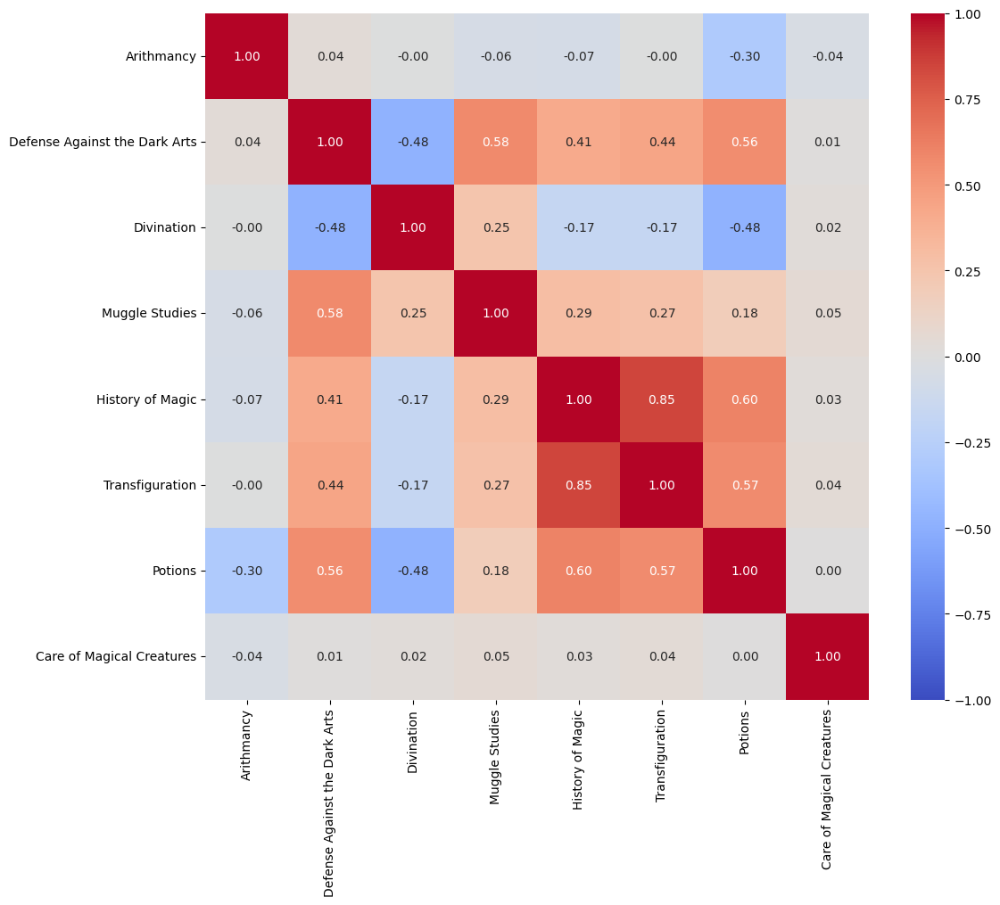

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

corr = df_train[col_vif].corr()

plt.figure(figsize=(12, 10))

sns.heatmap(
    corr,
    cmap='coolwarm',
    vmin=-1,
    vmax=1,
    annot=True,
    fmt=".2f"
)

plt.show()

In [40]:
print("mieux mais il y a encore pas mal de multi-colinearité donc on peut ajouter un PCA \n"*3)

mieux mais il y a encore pas mal de multi-colinearité donc on peut ajouter un PCA 
mieux mais il y a encore pas mal de multi-colinearité donc on peut ajouter un PCA 
mieux mais il y a encore pas mal de multi-colinearité donc on peut ajouter un PCA 



#### Split des colonnes pour la mise en prod (PREDICT) plus tard

In [41]:
print("On va splitter col_vif en 2\n"*3)

On va splitter col_vif en 2
On va splitter col_vif en 2
On va splitter col_vif en 2



In [42]:
col_vif

['Arithmancy',
 'Defense Against the Dark Arts',
 'Divination',
 'Muggle Studies',
 'History of Magic',
 'Transfiguration',
 'Potions',
 'Care of Magical Creatures']

In [43]:
col_num = [
    "Arithmancy",
    "Defense Against the Dark Arts",
    "Divination",
    "Muggle Studies",
    "History of Magic",
    "Transfiguration",
    "Potions",
    "Care of Magical Creatures"
]

col_cat = ["Best Hand"]  # colonne d'origine dans dataset_train.csv

In [44]:
from sklearn.decomposition import PCA

# df_temp = df_train[col_shortl].copy()    # Pour le PCA, on garde toutes les colonnes
df_temp = df_train[col_vif].copy()    # Pour le PCA, on va tester col_vif
df_temp = df_temp.dropna()

##########
#  Si on ne spécifie pas le nb d’estimateur, autant de PCA que de features
# ici 13

pca = PCA()  # Si on ne met pas n_components=, il va prendre n_components=nb_featires dans le df
df_temp_Proj = pca.fit_transform(df_temp)
df_temp_Proj

array([[ 8.80822389e+03,  5.10698719e+02, -2.83067047e+00, ...,
        -3.18282497e-01, -3.23774314e+00,  6.81597113e-01],
       [ 1.76644156e+04, -2.33933191e+02,  3.54366064e+01, ...,
        -1.77338190e+00,  1.26224324e-01,  1.92003173e-01],
       [-2.58743555e+04,  8.49686298e+02,  3.63038043e+01, ...,
         2.98823016e-01,  2.24313708e+00, -6.19224621e-01],
       ...,
       [ 1.43302590e+04, -1.39756297e+02, -7.32707521e+01, ...,
         2.44035934e-01,  1.27462999e+00,  2.58286623e-01],
       [ 3.31389417e+04, -5.53025557e+02,  7.17027302e+01, ...,
         1.75342041e+00, -1.38089116e-01, -4.69026627e-01],
       [-9.35961862e+02, -1.09985056e+01,  5.03649465e+00, ...,
        -3.18381909e+00, -1.89194733e+00,  8.65605660e-02]])

### Check matrice de correl 

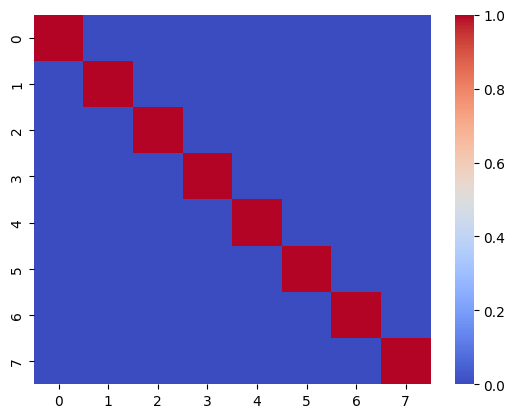

In [45]:
sns.heatmap(pd.DataFrame(df_temp_Proj).corr(), cmap='coolwarm');

In [46]:
pca.explained_variance_ratio_

array([9.99150109e-01, 8.43218277e-04, 6.52032038e-06, 1.04819136e-07,
       2.17727175e-08, 1.13724951e-08, 1.06499660e-08, 3.35478107e-09])

### Variance cumulee expliquée 

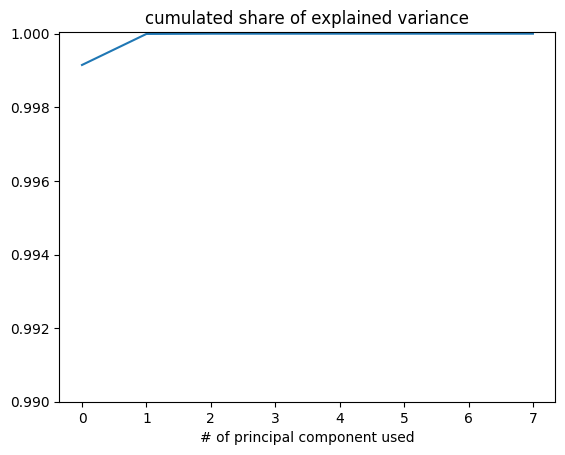

In [47]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.ylim(ymin=0.99)
plt.title('cumulated share of explained variance')
plt.xlabel('# of principal component used');


In [48]:
print("** avec n_components == 2, on explique deja 99% de la variance du dataset **\n" *3)

** avec n_components == 2, on explique deja 99% de la variance du dataset **
** avec n_components == 2, on explique deja 99% de la variance du dataset **
** avec n_components == 2, on explique deja 99% de la variance du dataset **



### Verification via Elbow method

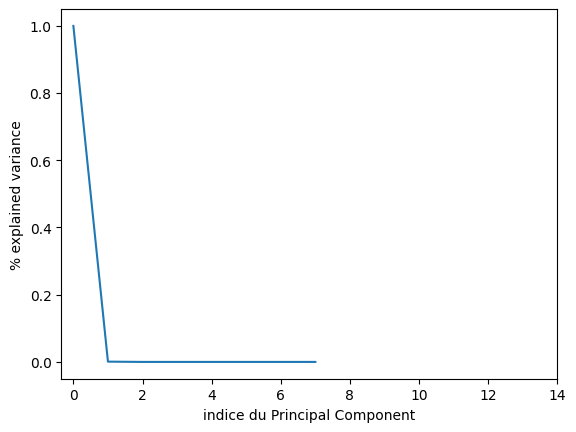

In [49]:
plt.plot(pca.explained_variance_ratio_)
plt.xlabel('indice du Principal Component')
plt.xticks(np.arange(0, 15, 2))
plt.ylabel('% explained variance');

In [50]:
print("Confirmation: avec PC0 et PC1, on est bien\n" *3)

Confirmation: avec PC0 et PC1, on est bien
Confirmation: avec PC0 et PC1, on est bien
Confirmation: avec PC0 et PC1, on est bien



In [51]:
# Variances (Percentage):
df_var_explained = pd.DataFrame(pca.explained_variance_ratio_)
df_var_explained = df_var_explained.rename(columns={0:"var_explained"})
df_var_explained  = round(df_var_explained * 100, 4)
df_var_explained

,var_explained
0,99.9150
1,0.0843
2,0.0007
3,0.0000
4,0.0000
5,0.0000
6,0.0000
7,0.0000


In [52]:
cum_var_explained = 0
index_pci_to_90 = 0
not_trigger = True
for i in df_var_explained.index:
    if cum_var_explained + df_var_explained.at[i, "var_explained"] < 90:
        cum_var_explained += df_var_explained.at[i, "var_explained"]
        index_pci_to_90 = i
    elif not_trigger:
        cum_var_explained += df_var_explained.at[i, "var_explained"]
        index_pci_to_90 = i
        not_trigger = False

cum_var_explained, index_pci_to_90

(99.915, 0)

## Modelisation

In [53]:
houses = list(df_train["Hogwarts House"].unique())
houses

['Ravenclaw', 'Slytherin', 'Gryffindor', 'Hufflepuff']

In [54]:
# df_train_temp = df_train[col_shortl].copy()
df_train_temp = df_train[col_vif].copy()

df_train_temp["Hogwarts House"] = df_train['Hogwarts House']
# df_train_temp = df_train_temp.dropna()

def label_encode_manuel(x):
            
    if x == 'Ravenclaw':        
        return "0"    
    elif x == 'Slytherin':        
        return "1"
    elif x == 'Gryffindor':        
        return "2"
    elif x == 'Hufflepuff':        
        return "3"
		
df_train_temp["houses"] = ""
df_train_temp.loc[:,'houses'] = df_train_temp['Hogwarts House'].apply(label_encode_manuel)
df_train_temp.head()

,Arithmancy,Defense Against the Dark Arts,Divination,Muggle Studies,History of Magic,Transfiguration,Potions,Care of Magical Creatures,Hogwarts House,houses
0,58384.0,4.878861,4.722,272.035831,5.231058,1039.788281,3.790369,0.715939,Ravenclaw,0
1,67239.0,5.520605,-5.612,-487.340557,4.107170,1058.944592,7.248742,0.091674,Slytherin,1
2,23702.0,3.660761,6.140,664.893521,3.555579,1088.088348,8.728531,-0.515327,Ravenclaw,0
3,32667.0,-6.977428,4.026,-537.001128,-4.809637,920.391449,0.821911,-0.014040,Gryffindor,2
4,60158.0,NaN,2.236,-444.262537,-3.444377,937.434724,4.311066,-0.264070,Gryffindor,2


In [55]:
(df_train_temp.isnull().sum() / len(df_train_temp)).sort_values(ascending=False)

History of Magic                 0.026875
Care of Magical Creatures        0.025000
Divination                       0.024375
Muggle Studies                   0.021875
Arithmancy                       0.021250
Transfiguration                  0.021250
Defense Against the Dark Arts    0.019375
Potions                          0.018750
Hogwarts House                   0.000000
houses                           0.000000
dtype: float64

In [56]:
print("MOINS DE 3% DE DATA MANQUANTE DANS CHAQUE COLONNES DONC SIMPLE_INPUTER == MEAN")

MOINS DE 3% DE DATA MANQUANTE DANS CHAQUE COLONNES DONC SIMPLE_INPUTER == MEAN


### KOH LANTA cad Manuelle

In [57]:
import numpy as np
import matplotlib.pyplot as plt


class MyLogiR():
    """
    Description:
        Ma classe de regression logistique.
        Permet de faire une classification binaire avec une descente de gradient.
    """


    def __init__(self, thetas, alpha=0.001, max_iter=100000):

        self.alpha = alpha
        self.max_iter = max_iter
        self.thetas = thetas

        self.X_with_intercept = None
        self.predictions = None
        self.loss = None

        # Permet de garder l'historique de la loss et des thetas
        # surtout utile pour voir comment se comporte la descente de gradient
        self.histo_loss = []
        self.histo_thetas = []

        # On garde la moyenne et l'ecart type calcules sur le TRAIN
        # ATTENTION : il ne faudra surtout pas les recalculer sur le TEST
        # Le TEST devra etre standardise avec les valeurs apprises sur le TRAIN
        self.moy = None
        self.std = None

        self.imputer_mean = None


    def add_intercept(self, X):
        """
        Ajoute une colonne de 1 a X pour pouvoir prendre en compte l'intercept.
        """

        # Si X n'a qu'une seule feature, on transforme le vecteur en colonne
        # afin de pouvoir ensuite ajouter la colonne de 1
        if len(X.shape) == 1:
            X = X.reshape((-1, 1))

        # Creation d'une colonne de 1
        # Elle correspondra au theta_0, cad l'intercept
        cst = np.ones((X.shape[0], 1))

        # On ajoute la colonne de 1 au debut de X
        X = np.hstack((cst, X))

        # Je le garde aussi dans self car sigmoid_ l'utilise
        self.X_with_intercept = X

        return X


    def imputer_fit_(self, x):
        """
        Remplace les NaN par la moyenne de chaque feature.
    
        ATTENTION :
        cette fonction est utilisee pendant le FIT.
        Les moyennes sont donc calculees uniquement sur le TRAIN
        puis gardees dans self.imputer_mean.
        """
    
        # Calcul de la moyenne de chaque feature
        # np.nanmean permet d'ignorer les NaN pour calculer la moyenne
        self.imputer_mean = np.nanmean(x, axis=0)
    
        # On travaille sur une copie pour ne pas modifier X directement
        x_temp = x.copy()
    
        # On recupere la position de tous les NaN
        index_nan = np.where(np.isnan(x_temp))
    
        # Pour chaque NaN, on utilise la moyenne de la colonne correspondante
        x_temp[index_nan] = self.imputer_mean[index_nan[1]]
    
        return x_temp


    def imputer_transform_(self, x):
        """
        Remplace les NaN de nouvelles donnees avec les moyennes
        calculees sur le TRAIN pendant le fit.
        """
    
        # On travaille sur une copie pour ne pas modifier X directement
        x_temp = x.copy()
    
        # On recupere la position des NaN
        index_nan = np.where(np.isnan(x_temp))
    
        # ATTENTION :
        # on NE RECALCULE PAS les moyennes sur le TEST.
        #
        # On reutilise les moyennes apprises sur le TRAIN
        x_temp[index_nan] = self.imputer_mean[index_nan[1]]
    
        return x_temp
    
    
    def sigmoid_(self, x, thet=None):
        """
        Applique la fonction sigmoid.
        """

        # Si aucun theta n'est passe en argument,
        # on utilise les thetas actuels du modele
        if thet is None:
            thet = self.thetas.copy()

        # Calcul de z = X.theta
        y_hat = self.X_with_intercept @ thet

        # Application de la sigmoid
        # => transforme le resultat en une probabilite comprise entre 0 et 1
        y_hat = 1 / (1 + np.exp(-y_hat))

        return y_hat


    def logistic_predict_proba_(self, X, thet=None, transform=True):
        """
        Retourne une probabilite pour chaque ligne de X.
        """

        # Si aucun theta n'est passe,
        # on utilise les thetas appris par le modele
        if thet is None:
            thet = self.thetas.copy()

        # ATTENTION :
        # lorsque cette fonction est utilisee sur de nouvelles donnees,
        # par exemple X_test, il faut appliquer la MEME standardisation
        # que celle utilisee pendant le fit.
        #
        # On utilise donc self.moy et self.std calcules sur X_train.
        #
        # Pendant le fit, X est deja standardise.
        # Dans ce cas on appellera cette fonction avec transform=False
        # pour ne surtout pas standardiser une deuxieme fois.
        if transform:
            X = self.transform_(X)

        # Remarque : pour que la multiplication avec theta fonctionne,
        # il faut ajouter une colonne de 1 a X pour l'intercept
        x = self.add_intercept(X)

        # Calcul de la probabilite
        y_hat = self.sigmoid_(x, thet)

        self.predictions = y_hat.copy()

        return y_hat


    def logistic_predict_label(self, X, thet=None):
        """
        Transforme les probabilites en labels 0 ou 1.
        """

        # On commence par calculer les probabilites
        y_hat = self.logistic_predict_proba_(X, thet)

        # Si proba > 0.5 => classe 1
        # sinon => classe 0
        y_hat = (y_hat > 0.5).astype(int)

        return y_hat


    def log_loss_elem_(self, y, y_hat, eps=1e-15):
        """
        Calcule la log loss pour chaque ligne.
        """

        # Rappel :
        # log(0) n'existe pas et tend vers -inf
        #
        # np.clip permet donc de forcer les probabilites a rester
        # dans l'intervalle [eps, 1-eps]
        # => ca protege les np.log juste en dessous
        y_hat = np.clip(y_hat, eps, 1 - eps)

        # Formule de la Binary Cross Entropy
        res = -(y * np.log(y_hat)
                + (1 - y) * np.log(1 - y_hat))

        self.loss = res

        return res


    def log_loss_(self, y, y_hat, eps=1e-15):
        """
        Calcule la moyenne de la log loss sur toutes les observations.
        """

        # On calcule d'abord la loss pour chaque ligne
        ndarray_temp = self.log_loss_elem_(y, y_hat, eps)

        # Puis on fait la moyenne
        # => une seule valeur de loss pour tout le dataset
        res = np.sum(ndarray_temp) / ndarray_temp.shape[0]

        self.loss = res

        return res


    def vec_log_gradient(self, x, y):
        """
        Calcule le gradient de la log loss de maniere vectorisee,
        donc sans boucle sur les observations.
        """

        # Transforme les vecteurs en colonnes si necessaire
        if len(x.shape) == 1:
            x = x.reshape((-1, 1))

        if len(y.shape) == 1:
            y = y.reshape((-1, 1))

        # On travaille sur une copie des thetas actuels
        theta = self.thetas.copy()

        # Verif du nombre de lignes :
        # il faut autant de y que de lignes dans X
        if x.shape[0] != y.shape[0]:
            return None

        # On a :
        # nombre de theta = nombre de features + 1
        # car il faut egalement theta_0 pour l'intercept
        if theta.shape != (x.shape[1] + 1, 1):
            return None

        # Ajout de la colonne de 1 pour l'intercept
        x_with_ones = self.add_intercept(x)

        # Nombre d'observations
        m = x.shape[0]

        # Rappel :
        # gradient de la regression logistique :
        #
        # 1/m * X.T @ (y_hat - y)
        #
        # sigmoid_ retourne ici y_hat
        gradient = (
            x_with_ones.T
            @ (self.sigmoid_(x_with_ones, theta) - y)
        ) / m

        return gradient


    def zscore(self, x):
        """
        Standardise X avec un Z-score.

        ATTENTION :
        cette fonction est utilisee pendant le FIT.
        Elle calcule donc la moyenne et l'ecart type du TRAIN
        et les garde dans self.moy et self.std.
        """

        # Calcul de la moyenne de chaque feature sur le TRAIN
        moy = x.mean(axis=0)

        # Calcul de l'ecart type de chaque feature sur le TRAIN
        std = x.std(axis=0)

        # Attentio, risque si ecart type @ 0 (ie: toutes ses valeurs sont identiques.)
        # Rustine pour eviter une division par zero, on remplace son std par 1.
        # => Application : Dans ce cas la colonne standardisee vaudra simplement 0.
        std[std == 0] = 1

        # Z-score :
        # X_standardise = (X - moyenne) / ecart_type
        x_stand = x - moy
        x_stand = x_stand / std

        # TRES IMPORTANT :
        # on garde ces valeurs car il faudra utiliser EXACTEMENT
        # les memes pour standardiser X_test au moment du predict
        self.moy = moy
        self.std = std

        return x_stand


    def transform_(self, x):
        """
        Standardise de nouvelles donnees avec la moyenne et
        l'ecart type calcules pendant le fit.
        """

        # Si le modele n'a pas encore ete fit,
        # on ne possede pas encore moy et std
        if self.moy is None or self.std is None:
            return x

        x_temp = self.imputer_transform_(x)
        
        # ATTENTION :
        # ici on NE RECALCULE PAS moy et std
        # On reutilise ceux du TRAIN.
        x_temp = (x_temp - self.moy) / self.std

        return x_temp


    def fit_(self, x, y):
        """
        Entraine la regression logistique avec une descente de gradient.
        """

        # On s'assure que theta est bien un vecteur colonne
        self.thetas = self.thetas.reshape((-1, 1)).copy()

        # Meme chose pour y
        y = y.reshape((-1, 1))

        # 1 - On remplace les NaN avec les moyennes du TRAIN
        # Ces moyennes sont gardees dans self.imputer_mean
        x = self.imputer_fit_(x)
        
        # IMPORTANT :
        # on standardise X_train UNE SEULE FOIS avant la descente de gradient.
        # On va les reutiliser plus tard sur X_test.
        x = self.zscore(x)

        # Reset de l'historique si jamais fit_ est appele plusieurs fois
        self.histo_loss = []
        self.histo_thetas = []

        # Descente de gradient
        for i in range(self.max_iter):

            # Calcul du gradient avec les theta actuels
            linear_grad = self.vec_log_gradient(x, y)

            if linear_grad is None:
                return None

            # Pas de la descente de gradient
            increment = self.alpha * linear_grad

            # Mise a jour :
            # theta(n+1) = theta(n) - alpha * gradient
            self.thetas = self.thetas - increment

            # ATTENTION :
            # x a DEJA ete standardise au debut de fit_.
            #
            # On met donc transform=False sinon
            # logistic_predict_proba_ appliquerait une deuxieme fois
            # la standardisation.
            y_hat = self.logistic_predict_proba_(x, transform=False)

            # On garde l'historique de la loss
            # => utile pour verifier qu'elle diminue bien
            self.histo_loss.append(self.log_loss_(y, y_hat))

            # On garde egalement l'evolution des theta
            self.histo_thetas.append(self.thetas.copy())

        return self.thetas


    def plot_loss_throught_iter(self):
        """
        Permet de voir l'evolution de la loss pendant
        la descente de gradient.
        """

        plt.figure(figsize=(10, 5))

        plt.plot(
            range(len(self.histo_loss)),
            self.histo_loss
        )

        plt.title("Evolution de la loss pendant la descente de gradient")
        plt.xlabel("Iterations")
        plt.ylabel("Log loss")

        plt.show()



In [58]:
class MyLogiR_1_vs_Rest:
    """
    Regression logistique multi-classes avec la methode One-vs-Rest.

    Le principe est d'entrainer un modele binaire MyLogiR
    pour chacune des classes.

    Exemple avec les maisons :

        Gryffindor  vs toutes les autres
        Hufflepuff vs toutes les autres
        Ravenclaw  vs toutes les autres
        Slytherin   vs toutes les autres
    """


    def __init__(self, alpha=0.001, max_iter=100000):

        self.alpha = alpha
        self.max_iter = max_iter

        # Contiendra la liste des classes
        # Exemple :
        # ['Gryffindor', 'Hufflepuff', 'Ravenclaw', 'Slytherin']
        self.classes = None

        # Dictionnaire qui permettra de garder un modele MyLogiR pour chacune des classes
        self.models = {}


    def fit_(self, X, y):
        """
        Entraine un modele de regression logistique pour chaque classe
        selon le principe One-vs-Rest.
        """

        # Les donnees peuvent arriver sous forme de DataFrame / Series pandas.
        # Comme les calculs de la classe sont faits avec numpy,
        # on les transforme une seule fois ici en ndarray.
        if hasattr(X, "to_numpy"):
            X = X.to_numpy()
    
        if hasattr(y, "to_numpy"):
            y = y.to_numpy()
    
        # On recupere toutes les classes presentes dans y (ie: 4 maisons)
        self.classes = np.unique(y)
    
        # Reset au cas ou on appelle fit_ plusieurs fois
        self.models = {}
    
        # On va maintenant entrainer UN modele binaire
        # pour chacune des classes
        for classe in self.classes:
    
            print(f"Training : {classe} vs others")
    
            # Pour la classe que l'on est en train d'entrainer :
            #
            # classe actuelle => 1
            # toutes les autres => 0
            #
            # => Gryffindor : [Gryffindor == 1, Ravenclaw == 0, Hufflepuff == 0, Slytherin == 0]
            y_binary = (y == classe).astype(int)
    
            # On transforme y en vecteur colonne
            y_binary = y_binary.reshape((-1, 1))
    
            # Initialisation des theta a 0
            # Rappel: ne pas oublier l'intercept (=> n+1 tethas)
            thetas = np.zeros((X.shape[1] + 1, 1))
    
            # Creation d'une regression logistique binaire
            # pour la classe actuelle
            model = MyLogiR(
                thetas=thetas,
                alpha=self.alpha,
                max_iter=self.max_iter
            )
    
            # Entrainement du modele :
            # classe actuelle vs toutes les autres
            model.fit_(X, y_binary)
    
            # On garde le modele entraine dans le dictionnaire
            self.models[classe] = model
    
        return self


    def predict_proba_(self, X):
        """
        Calcule la probabilite obtenue pour chaque classe.

        Retour :
            une matrice de taille :
            nombre_observations x nombre_classes
        """

        # X peut arriver sous forme de DataFrame pandas.
        # Comme tous les calculs de MyLogiR sont faits avec numpy,
        # on le transforme en ndarray avant de faire les predictions.
        if hasattr(X, "to_numpy"):
            X = X.to_numpy()
        
        probabilities = []

        # On passe X dans chacun des modeles binaires
        for classe in self.classes:

            # Recuperation du modele correspondant a la classe
            model = self.models[classe]

            # Calcul de :
            # P(classe | X)
            #
            # logistic_predict_proba_ va automatiquement
            # utiliser la moyenne et l'ecart type du TRAIN
            # qui ont ete sauvegardes pendant model.fit_()
            proba = model.logistic_predict_proba_(X)

            # proba est un vecteur colonne
            # => On le flatten pour pouvoir ensuite construire facilement la matrice de proba
            probabilities.append(proba.flatten())

        probabilities = np.column_stack(probabilities)

        return probabilities


    def predict_(self, X):
        """
        Retourne la classe predite pour chaque observation.
        """

        # On commence par calculer les probabilites
        # pour chacune des classes
        probabilities = self.predict_proba_(X)

        # Pour chaque ligne, on cherche la position de la probabilite max via np.argmax qui donne la position de la classe
        index_max = np.argmax(probabilities, axis=1)

        # self.classes contient les noms des maisons
        #
        # On transforme donc l'indice obtenu avec argmax en reverse encoding pour avoir les nom de classe en output.
        # Exemple : si index_max = 2 => self.classes[2] = "Ravenclaw"
        predictions = self.classes[index_max]

        return predictions
        
    
    def plot_loss_throught_iter(self):
        """
        Affiche l'evolution de la loss pour chacun
        des modeles binaires du One-vs-Rest.
        """

        # Comme on a un modele MyLogiR par maison,
        # => 4 descentes de gradient par Maison a afficher pour check la convergence
        for classe in self.classes:

            print(f"Loss : {classe} vs others")

            self.models[classe].plot_loss_throught_iter()


    def score_(self, X, y):
        """
        Calcule l'accuracy.
        """
    
        if hasattr(y, "to_numpy"):
            y = y.to_numpy()
    
        y_pred = self.predict_(X)
    
        accuracy = np.mean(y_pred == y)
    
        return accuracy


#### Comportement de la LOSS

Training : 0 vs others
Training : 1 vs others
Training : 2 vs others
Training : 3 vs others
Loss : 0 vs others


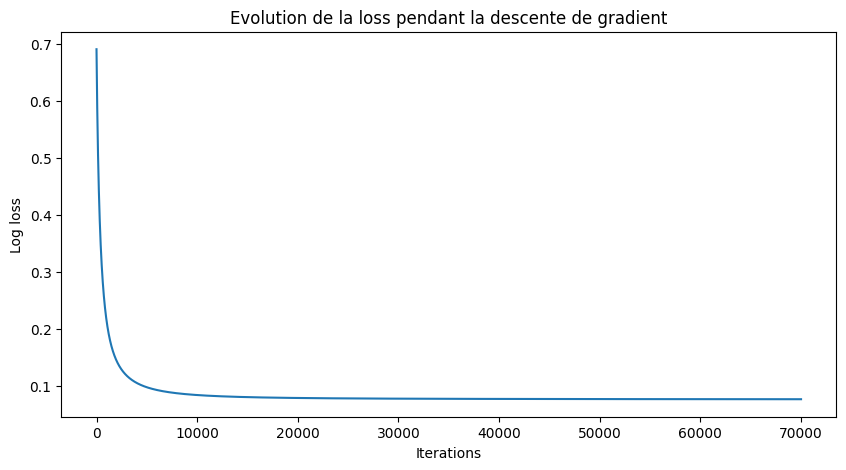

Loss : 1 vs others


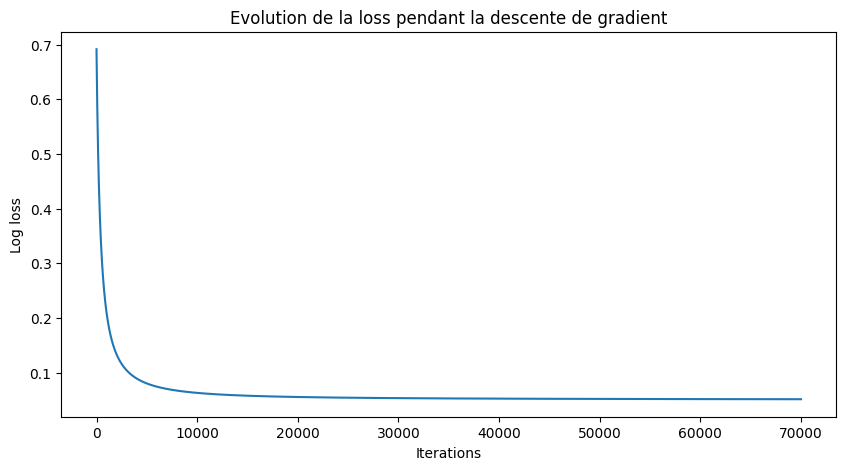

Loss : 2 vs others


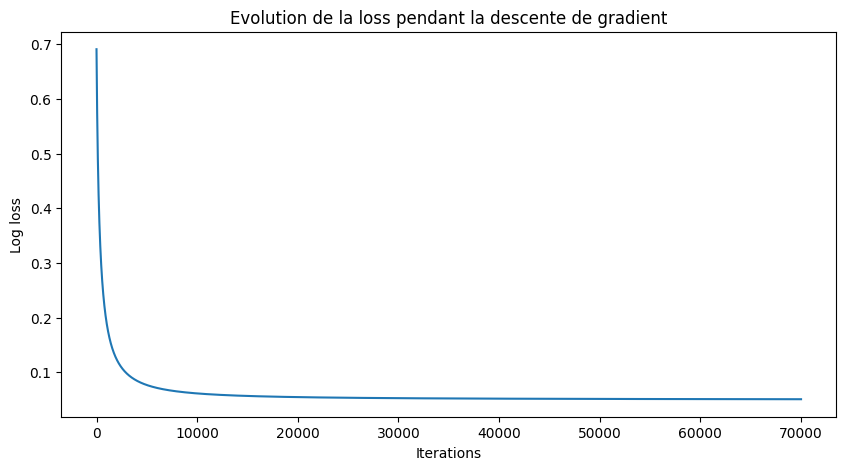

Loss : 3 vs others


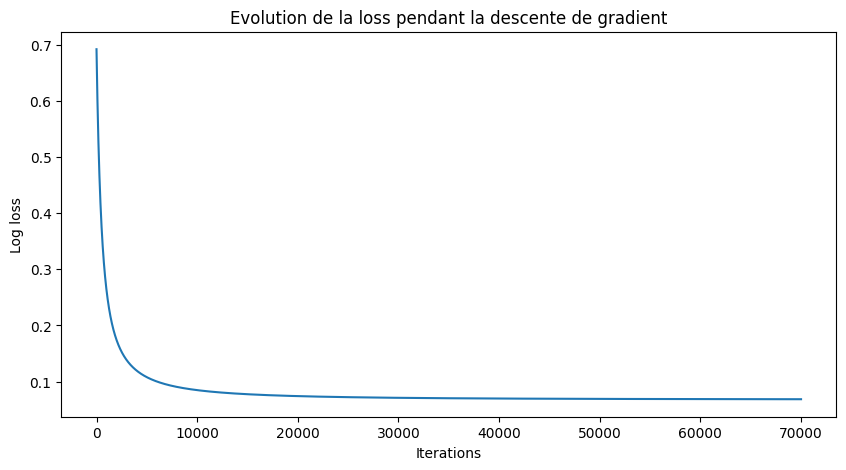

In [59]:
X_train = df_train_temp[col_vif]
y_train = df_train_temp["houses"]

model = MyLogiR_1_vs_Rest(
    alpha=0.005,
    #max_iter=30000
    max_iter=70000   # pas besoin de mettre 70000, 30000 c'est deja amplement suffisant
)

model.fit_(X_train, y_train)

model.plot_loss_throught_iter()

In [60]:
# check du gain marginal si on augmente le max_iter 
for classe in model.classes:

    loss = model.models[classe].histo_loss

    print(
        f"\nClasse {classe}",
        f"\n0     : {loss[0]:.6f}",
        f"\n1000  : {loss[999]:.6f}",
        f"\n5000  : {loss[4999]:.6f}",
        f"\n10000 : {loss[9999]:.6f}",
        f"\n15000 : {loss[14999]:.6f}",
        f"\n20000 : {loss[19999]:.6f}",
        f"\n25000 : {loss[24999]:.6f}",
        f"\n30000 : {loss[29999]:.6f}",
        f"\n40000 : {loss[39999]:.6f}",
        f"\n45000 : {loss[44999]:.6f}",
        f"\n50000 : {loss[49999]:.6f}",
        f"\n55000 : {loss[54999]:.6f}",
        f"\n60000 : {loss[59999]:.6f}",
        f"\n65000 : {loss[64999]:.6f}",
        f"\n70000 : {loss[-1]:.6f}"
    )


Classe 0 
0     : 0.691466 
1000  : 0.214298 
5000  : 0.097321 
10000 : 0.083620 
15000 : 0.079953 
20000 : 0.078454 
25000 : 0.077696 
30000 : 0.077258 
40000 : 0.076785 
45000 : 0.076644 
50000 : 0.076537 
55000 : 0.076452 
60000 : 0.076384 
65000 : 0.076328 
70000 : 0.076282

Classe 1 
0     : 0.691516 
1000  : 0.209536 
5000  : 0.080194 
10000 : 0.062935 
15000 : 0.057756 
20000 : 0.055416 
25000 : 0.054130 
30000 : 0.053333 
40000 : 0.052415 
45000 : 0.052129 
50000 : 0.051906 
55000 : 0.051729 
60000 : 0.051584 
65000 : 0.051464 
70000 : 0.051363

Classe 2 
0     : 0.690977 
1000  : 0.191023 
5000  : 0.076804 
10000 : 0.061454 
15000 : 0.056826 
20000 : 0.054705 
25000 : 0.053518 
30000 : 0.052770 
40000 : 0.051890 
45000 : 0.051612 
50000 : 0.051396 
55000 : 0.051222 
60000 : 0.051080 
65000 : 0.050961 
70000 : 0.050860

Classe 3 
0     : 0.692036 
1000  : 0.262020 
5000  : 0.107767 
10000 : 0.084675 
15000 : 0.077384 
20000 : 0.074004 
25000 : 0.072131 
30000 : 0.070981 
40000

In [61]:
print("comportement ok")

comportement ok


#### Modelisation pour check l'accuracy

In [62]:
from sklearn.model_selection import train_test_split

# Dataset complet
X = df_train_temp[col_vif]
y = df_train_temp["houses"]

# On separe les donnees :
# 70% pour entrainer le modele
# 30% pour verifier ses performances sur des donnees qu'il n'a jamais vues
X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.20,random_state=42,stratify=y)

print("X_train :", X_train.shape)
print("X_val   :", X_val.shape)
print("y_train :", y_train.shape)
print("y_val   :", y_val.shape)

for max_iter in [1000, 5000, 10000, 20000, 30000]:

    model = MyLogiR_1_vs_Rest(
        alpha=0.005,
        max_iter=max_iter
    )

    model.fit_(X_train, y_train)

    # Predictions sur les donnees utilisees pendant l'entrainement
    y_pred_train = model.predict_(X_train)

    # Predictions sur des donnees que le modele n'a jamais vues
    y_pred_val = model.predict_(X_val)

    acc_train = np.mean(
        y_pred_train == y_train.to_numpy()
    )

    acc_val = np.mean(
        y_pred_val == y_val.to_numpy()
    )

    print(
        f"{max_iter:5d} iterations : "
        f"train = {acc_train:.4f} | "
        f"val = {acc_val:.4f}"
    )

X_train : (1280, 8)
X_val   : (320, 8)
y_train : (1280,)
y_val   : (320,)
Training : 0 vs others
Training : 1 vs others
Training : 2 vs others
Training : 3 vs others
 1000 iterations : train = 0.9789 | val = 0.9906
Training : 0 vs others
Training : 1 vs others
Training : 2 vs others
Training : 3 vs others
 5000 iterations : train = 0.9797 | val = 0.9906
Training : 0 vs others
Training : 1 vs others
Training : 2 vs others
Training : 3 vs others
10000 iterations : train = 0.9797 | val = 0.9906
Training : 0 vs others
Training : 1 vs others
Training : 2 vs others
Training : 3 vs others
20000 iterations : train = 0.9789 | val = 0.9906
Training : 0 vs others
Training : 1 vs others
Training : 2 vs others
Training : 3 vs others
30000 iterations : train = 0.9789 | val = 0.9906


In [63]:
print("Modele NON valide pour le moment car accuracy < 0.98 => REGULARISATION, ET: pas besoin de plus de 10000 ITERATIONS \n"*3)

Modele NON valide pour le moment car accuracy < 0.98 => REGULARISATION, ET: pas besoin de plus de 10000 ITERATIONS 
Modele NON valide pour le moment car accuracy < 0.98 => REGULARISATION, ET: pas besoin de plus de 10000 ITERATIONS 
Modele NON valide pour le moment car accuracy < 0.98 => REGULARISATION, ET: pas besoin de plus de 10000 ITERATIONS 



In [64]:
print("Ce qui marche bien: L2 avec C=0.2: vu avec sklearn \n"*3)

Ce qui marche bien: L2 avec C=0.2: vu avec sklearn 
Ce qui marche bien: L2 avec C=0.2: vu avec sklearn 
Ce qui marche bien: L2 avec C=0.2: vu avec sklearn 



In [65]:
print("JE PROPOSE DE NE PAS FAIRE DE PCA MANUELLE CAR TROP COMPLIQUE A EXPLIQUER MATHEMATIQUEMENT ET A CODER \n"*3)

JE PROPOSE DE NE PAS FAIRE DE PCA MANUELLE CAR TROP COMPLIQUE A EXPLIQUER MATHEMATIQUEMENT ET A CODER 
JE PROPOSE DE NE PAS FAIRE DE PCA MANUELLE CAR TROP COMPLIQUE A EXPLIQUER MATHEMATIQUEMENT ET A CODER 
JE PROPOSE DE NE PAS FAIRE DE PCA MANUELLE CAR TROP COMPLIQUE A EXPLIQUER MATHEMATIQUEMENT ET A CODER 



In [66]:
print("de toute facon, voir point juste apres, PCA n'apporte rien, on est meme moins bien en ACCURACY \n"*3)

de toute facon, voir point juste apres, PCA n'apporte rien, on est meme moins bien en ACCURACY 
de toute facon, voir point juste apres, PCA n'apporte rien, on est meme moins bien en ACCURACY 
de toute facon, voir point juste apres, PCA n'apporte rien, on est meme moins bien en ACCURACY 



In [67]:
print("Juste avec la regularisation, ca va passer. Ce qui marche bien: L2 avec C=0.2: vu avec sklearn \n"*3)

Juste avec la regularisation, ca va passer. Ce qui marche bien: L2 avec C=0.2: vu avec sklearn 
Juste avec la regularisation, ca va passer. Ce qui marche bien: L2 avec C=0.2: vu avec sklearn 
Juste avec la regularisation, ca va passer. Ce qui marche bien: L2 avec C=0.2: vu avec sklearn 



#### Cross-Validation manuelle (plus puissant):

In [68]:
# Dataset complet
X = df_train_temp[col_vif]
y = df_train_temp["houses"]

data_cv = X.copy()
data_cv["houses"] = y

# Nombre de folds pour la Cross Val
n_split = 5

# Shuffle du dataset avant de creer les folds
data_cv = data_cv.sample(frac=1, random_state=42).reset_index(drop=True)

# Taille d'un fold
len_split = int(data_cv.shape[0] / n_split)

# cache de l'accuracy obtenue sur chacun des 5 folds
scores = []

start = 0
stop = len_split

# Cross Validation manuelle avec 5 folds
for k in range(n_split):

    print(f"\n---------- FOLD {k + 1} ----------")

    # Le fold courant sert de jeu de validation
    data_val = data_cv.iloc[start:stop, :]

    # Toutes les autres lignes servent a entrainer le modele
    data_train = data_cv.drop(
        index=data_val.index
    )

    # Separation X / y pour le TRAIN
    X_train = data_train[col_vif]
    y_train = data_train["houses"]

    # Separation X / y pour la VALIDATION
    X_val = data_val[col_vif]
    y_val = data_val["houses"]

    # Appel de la LR One-vs-Rest manuelle
    model = MyLogiR_1_vs_Rest(alpha=0.005, max_iter=10000)

    model.fit_(X_train, y_train)

    # Prediction sur le VAL SET
    y_pred_val = model.predict_(X_val)

    # Calcul manuel de l'accuracy
    accuracy = np.mean(
        y_pred_val == y_val.to_numpy()
    )

    # On garde le resultat du fold
    scores.append(accuracy)

    print(f"Accuracy fold {k + 1} : "f"{accuracy:.4f}")

    # Next fold
    start = stop
    stop += len_split


# Transformation en array numpy pour calculer
# facilement la moyenne et l'ecart type
scores = np.array(scores)

print("\nScores :", scores)

print(f"Accuracy moyenne : "f"{scores.mean():.4f}")

print(f"Ecart type : "f"{scores.std():.4f}")

print(f"Accuracy moyenne : "f"{scores.mean() * 100:.2f}%")


---------- FOLD 1 ----------
Training : 0 vs others
Training : 1 vs others
Training : 2 vs others
Training : 3 vs others
Accuracy fold 1 : 0.9875

---------- FOLD 2 ----------
Training : 0 vs others
Training : 1 vs others
Training : 2 vs others
Training : 3 vs others
Accuracy fold 2 : 0.9844

---------- FOLD 3 ----------
Training : 0 vs others
Training : 1 vs others
Training : 2 vs others
Training : 3 vs others
Accuracy fold 3 : 0.9875

---------- FOLD 4 ----------
Training : 0 vs others
Training : 1 vs others
Training : 2 vs others
Training : 3 vs others
Accuracy fold 4 : 0.9781

---------- FOLD 5 ----------
Training : 0 vs others
Training : 1 vs others
Training : 2 vs others
Training : 3 vs others
Accuracy fold 5 : 0.9688

Scores : [0.9875   0.984375 0.9875   0.978125 0.96875 ]
Accuracy moyenne : 0.9812
Ecart type : 0.0071
Accuracy moyenne : 98.12%


In [69]:
print("ATTENTION:  avec CV, on arrive a etre > 0.98 en ACCURACY. Sur 5 run, 3 > 0.98, 1 tres proche, 1 @ 0.96875 compensés par les autres \n"*3)

ATTENTION:  avec CV, on arrive a etre > 0.98 en ACCURACY. Sur 5 run, 3 > 0.98, 1 tres proche, 1 @ 0.96875 compensés par les autres 
ATTENTION:  avec CV, on arrive a etre > 0.98 en ACCURACY. Sur 5 run, 3 > 0.98, 1 tres proche, 1 @ 0.96875 compensés par les autres 
ATTENTION:  avec CV, on arrive a etre > 0.98 en ACCURACY. Sur 5 run, 3 > 0.98, 1 tres proche, 1 @ 0.96875 compensés par les autres 



### Regularisation: TO DO, EN FAIT PAS BESPOIN CAR RESULTATS SUFFISAMMENT BONS

In [70]:
print("cheese NAN")

cheese NAN


## Entrainement sur toute la data + sauvegarde du model

In [71]:
col_vif = ['Arithmancy',
 'Defense Against the Dark Arts',
 'Divination',
 'Muggle Studies',
 'History of Magic',
 'Transfiguration',
 'Potions',
 'Care of Magical Creatures']

In [72]:
# Dataset complet
X_train = df_train_temp[col_vif]
y_train = df_train_temp["houses"]

model_lr_manuel = MyLogiR_1_vs_Rest(alpha=0.005, max_iter=10000)
model_lr_manuel.fit_(X_train, y_train)
model_lr_manuel

Training : 0 vs others
Training : 1 vs others
Training : 2 vs others
Training : 3 vs others


## Sauvegarde du modele

In [73]:
joblib.dump(model_lr_manuel, "model_logreg.pkl")

['model_logreg.pkl']

## Load du modele

In [74]:
loaded_model_logreg = joblib.load("model_logreg.pkl")

## Predictions, Evaluation du modele sur le test

In [75]:
loaded_model_logreg = joblib.load("model_logreg.pkl")

In [76]:
df_test = pd.read_csv('datasets/dataset_test.csv', sep = ',', header=0).drop(columns=['Index'])
df_test.head()

,Hogwarts House,First Name,Last Name,Birthday,Best Hand,Arithmancy,Astronomy,Herbology,Defense Against the Dark Arts,Divination,Muggle Studies,Ancient Runes,History of Magic,Transfiguration,Potions,Care of Magical Creatures,Charms,Flying
0,NaN,Rico,Sargent,2001-10-06,Right,41642.0,696.096071,3.020172,-6.960961,7.996,-365.151850,393.138185,4.207691,1046.742736,3.668983,0.373853,-244.48172,-13.62
1,NaN,Tamara,Shackelford,1998-01-08,Left,45352.0,-370.844655,2.965226,3.708447,6.349,522.580486,602.853051,6.460017,1048.053878,8.514622,0.577432,-231.29200,-26.26
2,NaN,Staci,Crandall,1998-09-15,Left,43502.0,320.303990,-6.185697,-3.203040,4.619,-630.073207,588.071795,-5.565818,936.437358,1.850829,-1.647150,-252.99343,200.15
3,NaN,Dee,Gavin,2001-05-10,Right,61831.0,407.202928,4.962442,NaN,NaN,-449.179806,427.699966,NaN,1043.397718,4.656573,1.164708,-244.01660,-11.15
4,NaN,Gregory,Gustafson,1999-02-01,Right,NaN,288.337747,3.737656,-2.883377,4.886,-449.732166,385.712782,2.876347,1051.377936,2.750586,0.102104,-243.99806,-7.12


In [77]:
X_test = df_test[col_vif]
y_pred = loaded_model_logreg.predict_(X_test)
y_pred

array(['3', '0', '2', '3', '3', '1', '0', '3', '0', '3', '3', '1', '1',
       '1', '1', '3', '0', '1', '0', '3', '3', '1', '0', '0', '3', '3',
       '0', '1', '2', '0', '3', '3', '2', '3', '3', '0', '2', '0', '1',
       '0', '0', '1', '3', '1', '3', '0', '1', '2', '0', '1', '0', '3',
       '0', '0', '3', '1', '1', '0', '3', '2', '2', '2', '3', '3', '0',
       '3', '3', '0', '3', '0', '1', '1', '2', '0', '2', '3', '3', '2',
       '0', '2', '0', '3', '1', '2', '2', '3', '3', '3', '0', '0', '3',
       '1', '2', '3', '0', '0', '2', '1', '3', '0', '3', '3', '3', '1',
       '0', '0', '3', '1', '1', '3', '3', '1', '2', '0', '3', '0', '0',
       '3', '1', '0', '2', '3', '2', '2', '0', '0', '1', '0', '3', '0',
       '0', '2', '2', '1', '3', '0', '0', '1', '2', '3', '3', '0', '2',
       '0', '2', '0', '0', '3', '3', '0', '3', '2', '2', '0', '0', '2',
       '3', '1', '3', '0', '0', '3', '3', '3', '0', '1', '3', '3', '3',
       '3', '2', '3', '3', '1', '3', '2', '2', '3', '3', '1', '0

### Reverse encoding de y_preds 

In [78]:
houses_decode = {
    "0": "Gryffindor",
    "1": "Hufflepuff",
    "2": "Ravenclaw",
    "3": "Slytherin"
}

y_pred_houses = np.array([houses_decode[pred]for pred in y_pred])
y_pred_houses

array(['Slytherin', 'Gryffindor', 'Ravenclaw', 'Slytherin', 'Slytherin',
       'Hufflepuff', 'Gryffindor', 'Slytherin', 'Gryffindor', 'Slytherin',
       'Slytherin', 'Hufflepuff', 'Hufflepuff', 'Hufflepuff',
       'Hufflepuff', 'Slytherin', 'Gryffindor', 'Hufflepuff',
       'Gryffindor', 'Slytherin', 'Slytherin', 'Hufflepuff', 'Gryffindor',
       'Gryffindor', 'Slytherin', 'Slytherin', 'Gryffindor', 'Hufflepuff',
       'Ravenclaw', 'Gryffindor', 'Slytherin', 'Slytherin', 'Ravenclaw',
       'Slytherin', 'Slytherin', 'Gryffindor', 'Ravenclaw', 'Gryffindor',
       'Hufflepuff', 'Gryffindor', 'Gryffindor', 'Hufflepuff',
       'Slytherin', 'Hufflepuff', 'Slytherin', 'Gryffindor', 'Hufflepuff',
       'Ravenclaw', 'Gryffindor', 'Hufflepuff', 'Gryffindor', 'Slytherin',
       'Gryffindor', 'Gryffindor', 'Slytherin', 'Hufflepuff',
       'Hufflepuff', 'Gryffindor', 'Slytherin', 'Ravenclaw', 'Ravenclaw',
       'Ravenclaw', 'Slytherin', 'Slytherin', 'Gryffindor', 'Slytherin',
       'S

In [79]:
df_preds = pd.DataFrame({"Index": np.arange(len(y_pred_houses)), "Hogwarts House": y_pred_houses})

df_preds.to_csv("houses.csv",index=False)

In [80]:
print("CQFD \n"*3)

CQFD 
CQFD 
CQFD 



# Bonus 

## Modele KNN

In [81]:
import numpy as np


class MyKNN_norm:
    """
    Classification avec la methode des K plus proches voisins.

    Pour chaque nouvelle observation :
    - calcul de la distance avec tous les points du train
    - on garde les k points les plus proches
    - on regarde leurs classes
    - la classe majoritaire devient la prediction
    """

    def __init__(self, n_neighbors=5):

        # Nombre de voisins utilises pour la prediction
        self.n_neighbors = n_neighbors

        # On garde les data du train
        # => le KNN ne calcule pas de theta comme la regression logistique
        self.X_train = None
        self.y_train = None

        # Pour l'imputation des valeurs manquantes
        self.imputer_mean = None

        # Min et max calcules sur le TRAIN
        # => on les reutilisera pour le predict
        self.min = None
        self.max = None


    def distance_(self, point1, point2):
        """
        Calcule la distance euclidienne entre deux points.
        """

        distance = np.sqrt(np.sum((point1 - point2) ** 2))

        return distance


    def imputer_fit_(self, X):
        """
        Calcule les moyennes des colonnes du TRAIN.
        """

        # Moyenne de chaque feature sans tenir compte des NaN
        # => ces valeurs seront reutilisees pour le test
        self.imputer_mean = np.nanmean(X, axis=0)

        return self


    def imputer_transform_(self, X):
        """
        Remplace les NaN avec les moyennes calculees
        sur le TRAIN.
        """

        # Copie pour ne pas modifier les data originales
        X_temp = np.array(X, dtype=float, copy=True)

        # Position des NaN
        index_nan = np.where(np.isnan(X_temp))

        # On remplace chaque NaN par la moyenne de sa colonne
        # => moyenne calculee uniquement sur le train
        X_temp[index_nan] = self.imputer_mean[index_nan[1]]

        return X_temp


    def minmax_fit_(self, X):
        """
        Calcule le min et le max de chaque feature
        uniquement sur le TRAIN.
        """

        self.min = np.min(X, axis=0)
        self.max = np.max(X, axis=0)

        return self


    def minmax_transform_(self, X):
        """
        Normalise les data entre 0 et 1 avec le min et max
        calcules pendant le fit.
        """

        # Difference entre max et min
        range_ = self.max - self.min

        # Si max = min => feature constante
        # => on met 1 pour eviter une division par zero
        range_[range_ == 0] = 1

        X_temp = (X - self.min) / range_

        return X_temp


    def transform_(self, X):
        """
        Impute et normalise de nouvelles donnees.
        """

        # Si DataFrame => numpy
        if hasattr(X, "to_numpy"):
            X = X.to_numpy()

        X = np.array(X, dtype=float, copy=True)

        # Meme transformation que pour le train
        # => imputation avec moyenne du train
        # => MinMax avec min/max du train
        X_temp = self.imputer_transform_(X)
        X_temp = self.minmax_transform_(X_temp)

        return X_temp


    def fit_(self, X, y):
        """
        Enregistre les donnees du TRAIN.

        Avec un KNN il n'y a pas vraiment d'entrainement
        comme avec notre regression logistique.
        """

        # Si DataFrame / Series => numpy
        if hasattr(X, "to_numpy"):
            X = X.to_numpy()

        if hasattr(y, "to_numpy"):
            y = y.to_numpy()

        X = np.array(X, dtype=float, copy=True)
        y = np.array(y)

        # Imputation
        # => calcul des moyennes uniquement sur le train
        self.imputer_fit_(X)
        X_temp = self.imputer_transform_(X)

        # MinMax
        # => calcul du min et max uniquement sur le train
        self.minmax_fit_(X_temp)
        X_temp = self.minmax_transform_(X_temp)

        # On garde toutes les observations du train en memoire
        # => elles serviront pour calculer les distances pendant predict
        self.X_train = X_temp
        self.y_train = y

        return self


    def predict_one_(self, point):
        """
        Prediction pour UNE seule observation.
        """

        distances = []

        # On calcule la distance avec tous les points du train
        for point_train in self.X_train:
            distance = self.distance_(point, point_train)
            distances.append(distance)

        distances = np.array(distances)

        # On trie les distances
        # => on garde les index des k voisins les plus proches
        index_nearest = np.argsort(distances)[:self.n_neighbors]

        # On recupere les classes des k voisins
        nearest_labels = self.y_train[index_nearest]

        # On compte combien de fois chaque classe apparait
        classes, counts = np.unique(nearest_labels, return_counts=True)

        # Classe qui apparait le plus souvent
        # => vote majoritaire
        index_max = np.argmax(counts)
        prediction = classes[index_max]

        return prediction


    def predict_(self, X):
        """
        Prediction pour toutes les observations de X.
        """

        # Transformation des nouvelles data
        # => imputation + MinMax avec les valeurs du train
        X_temp = self.transform_(X)

        predictions = []

        # Prediction ligne par ligne
        for point in X_temp:
            prediction = self.predict_one_(point)
            predictions.append(prediction)

        return np.array(predictions)


    def score_(self, X, y):
        """
        Calcule l'accuracy.
        """

        if hasattr(y, "to_numpy"):
            y = y.to_numpy()

        y_pred = self.predict_(X)

        # Nombre de bonnes predictions / nombre total
        accuracy = np.mean(y_pred == y)

        return accuracy


### n_neighbors optimal ? 

In [82]:
# Dataset complet
data = df_train_temp[col_vif + ["houses"]].copy()

n_split = 5
len_split = int(data.shape[0] / n_split)

# On melange les lignes du dataset
# => random_state pour pouvoir retrouver exactement le meme resultat
data = data.sample(frac=1, random_state=42)

# Les valeurs de k que l'on veut tester
k_values = range(1, 16, 2)

scores_mean = []
scores_std = []

# On teste chaque valeur de k
for n_neighbors in k_values:

    scores = []

    # Initialisation du premier fold
    start = 0
    stop = len_split

    # Cross validation manuelle a 5 folds
    for fold in range(n_split):

        # Le fold courant sert de validation
        data_val = data.iloc[start:stop, :]

        # Toutes les autres lignes servent pour le train
        data_train = data.drop(index=data_val.index)

        # Separation X / y
        X_train = data_train[col_vif]
        y_train = data_train["houses"]

        X_val = data_val[col_vif]
        y_val = data_val["houses"]

        # Creation du KNN avec le k que l'on est en train de tester
        model_knn = MyKNN_norm(n_neighbors=n_neighbors)

        # Fit uniquement sur le train
        # => imputation et standardisation sont donc calculees sur le train
        model_knn.fit_(X_train, y_train)

        # Prediction sur le fold de validation
        y_pred = model_knn.predict_(X_val)

        # Accuracy du fold
        accuracy = np.mean(y_pred == y_val.to_numpy())

        scores.append(accuracy)

        # Setup du prochain fold
        start = stop
        stop += len_split

    # Moyenne et std des 5 folds pour ce k
    scores_mean.append(np.array(scores).mean())
    scores_std.append(np.array(scores).std())

    print(
        f"k = {n_neighbors:2d} | "
        f"scores = {[round(score, 4) for score in scores]} | "
        f"mean = {np.mean(scores):.4f} | "
        f"std = {np.std(scores):.4f}"
    )

k =  1 | scores = [0.9719, 0.9562, 0.9656, 0.9594, 0.9625] | mean = 0.9631 | std = 0.0054
k =  3 | scores = [0.9875, 0.9812, 0.9812, 0.9781, 0.9688] | mean = 0.9794 | std = 0.0061
k =  5 | scores = [0.9875, 0.9812, 0.9875, 0.9781, 0.9688] | mean = 0.9806 | std = 0.0070
k =  7 | scores = [0.9875, 0.9812, 0.9875, 0.9781, 0.9656] | mean = 0.9800 | std = 0.0081
k =  9 | scores = [0.9875, 0.9812, 0.9875, 0.9781, 0.9656] | mean = 0.9800 | std = 0.0081
k = 11 | scores = [0.9875, 0.9812, 0.9875, 0.9781, 0.9656] | mean = 0.9800 | std = 0.0081
k = 13 | scores = [0.9875, 0.9844, 0.9875, 0.9781, 0.9656] | mean = 0.9806 | std = 0.0082
k = 15 | scores = [0.9844, 0.9844, 0.9875, 0.9781, 0.9656] | mean = 0.9800 | std = 0.0078


In [83]:
print("meilleur k=5\n" *3)

meilleur k=5
meilleur k=5
meilleur k=5



In [84]:
best_score = max(scores_mean)

# On considere comme ex-aequo les scores identiques a 4 decimales
index_best = [i for i, score in enumerate(scores_mean) if round(score, 4) == round(best_score, 4)]

# Parmi les meilleurs => on prend celui avec la plus petite std
index_best = min(index_best, key=lambda i: scores_std[i])

best_k = list(k_values)[index_best]
best_score = scores_mean[index_best]
best_std = scores_std[index_best]

print(f"\nMeilleur k : {best_k}")
print(f"Accuracy moyenne : {best_score:.4f}")
print(f"Std : {best_std:.4f}")


Meilleur k : 5
Accuracy moyenne : 0.9806
Std : 0.0070


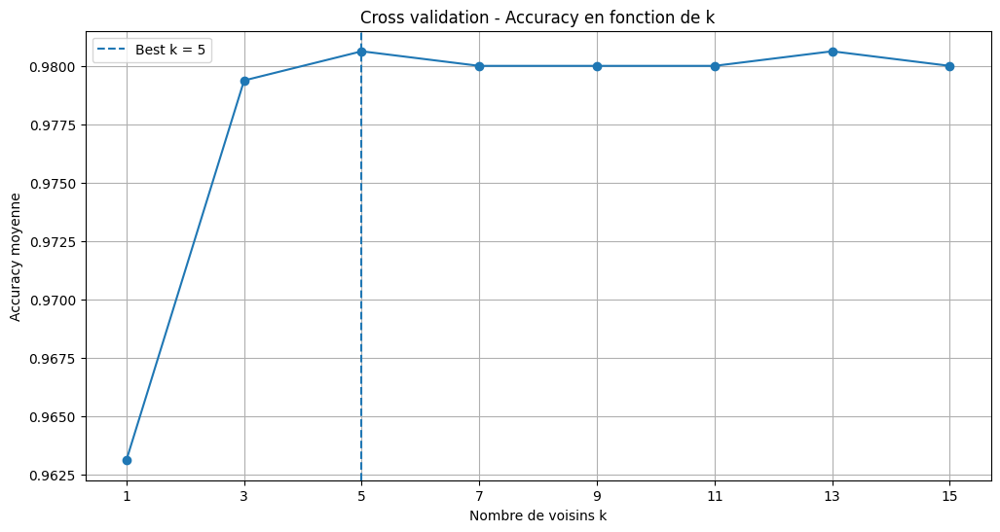

In [85]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

plt.plot(k_values, scores_mean, marker='o')

# On affiche le meilleur k
plt.axvline(best_k, linestyle='--', label=f'Best k = {best_k}')

plt.xticks(k_values)

plt.xlabel("Nombre de voisins k")
plt.ylabel("Accuracy moyenne")
plt.title("Cross validation - Accuracy en fonction de k")

plt.legend()
plt.grid()

plt.show()

### Entrainement sur toute la data

In [86]:
# Toute la data
X_train = df_train_temp[col_vif]
y_train = df_train_temp["houses"]

# Les 3 modeles
model_knn = MyKNN_norm(n_neighbors=5)

# Entrainement sur toute la data
model_knn.fit_(X_train, y_train)

### Sauvegarde du Classifier

In [87]:
joblib.dump(model_knn, "model_knn.pkl")

['model_knn.pkl']

### Load du Classifier

In [88]:
model_knn = joblib.load("model_knn.pkl")

### Predictions

In [89]:
X_test = df_test[col_vif]

y_pred = model_knn.predict_(X_test)

y_pred

array(['3', '0', '2', '3', '3', '1', '0', '3', '0', '3', '3', '1', '1',
       '1', '1', '3', '0', '1', '0', '3', '3', '1', '0', '0', '3', '3',
       '0', '1', '2', '0', '3', '3', '2', '3', '3', '0', '2', '0', '1',
       '0', '0', '1', '3', '1', '3', '0', '1', '2', '0', '1', '0', '3',
       '0', '0', '3', '1', '1', '0', '3', '2', '2', '2', '3', '3', '0',
       '3', '3', '0', '3', '0', '1', '1', '2', '0', '2', '3', '3', '2',
       '0', '2', '0', '3', '1', '2', '2', '3', '3', '3', '0', '0', '3',
       '1', '2', '3', '0', '0', '2', '1', '3', '0', '3', '3', '3', '1',
       '0', '0', '3', '1', '1', '3', '3', '1', '2', '0', '3', '0', '0',
       '3', '1', '0', '2', '3', '2', '2', '0', '0', '1', '0', '3', '0',
       '0', '2', '2', '1', '3', '0', '0', '1', '2', '3', '3', '0', '2',
       '0', '2', '0', '0', '3', '3', '0', '3', '2', '2', '0', '0', '2',
       '3', '1', '3', '0', '0', '3', '3', '3', '0', '1', '3', '3', '3',
       '3', '2', '3', '3', '1', '3', '2', '2', '3', '3', '1', '0

In [90]:
houses_decode = {
    "0": "Gryffindor",
    "1": "Hufflepuff",
    "2": "Ravenclaw",
    "3": "Slytherin"
}

y_pred_houses = np.array([houses_decode[pred]for pred in y_pred])
y_pred_houses

array(['Slytherin', 'Gryffindor', 'Ravenclaw', 'Slytherin', 'Slytherin',
       'Hufflepuff', 'Gryffindor', 'Slytherin', 'Gryffindor', 'Slytherin',
       'Slytherin', 'Hufflepuff', 'Hufflepuff', 'Hufflepuff',
       'Hufflepuff', 'Slytherin', 'Gryffindor', 'Hufflepuff',
       'Gryffindor', 'Slytherin', 'Slytherin', 'Hufflepuff', 'Gryffindor',
       'Gryffindor', 'Slytherin', 'Slytherin', 'Gryffindor', 'Hufflepuff',
       'Ravenclaw', 'Gryffindor', 'Slytherin', 'Slytherin', 'Ravenclaw',
       'Slytherin', 'Slytherin', 'Gryffindor', 'Ravenclaw', 'Gryffindor',
       'Hufflepuff', 'Gryffindor', 'Gryffindor', 'Hufflepuff',
       'Slytherin', 'Hufflepuff', 'Slytherin', 'Gryffindor', 'Hufflepuff',
       'Ravenclaw', 'Gryffindor', 'Hufflepuff', 'Gryffindor', 'Slytherin',
       'Gryffindor', 'Gryffindor', 'Slytherin', 'Hufflepuff',
       'Hufflepuff', 'Gryffindor', 'Slytherin', 'Ravenclaw', 'Ravenclaw',
       'Ravenclaw', 'Slytherin', 'Slytherin', 'Gryffindor', 'Slytherin',
       'S

# ZONE INTERDITE : sert juste a checker nos resultats (utilisation de librairies systeme)

## PCA : recherche du nb de features optim pour expliquer 90% de la variance du dataset¶

In [156]:
from sklearn.decomposition import PCA

# df_temp = df_train[col_shortl].copy()    # Pour le PCA, on garde toutes les colonnes
df_temp = df_train[col_vif].copy()    # Pour le PCA, on va tester col_vif
df_temp = df_temp.dropna()

##########
#  Si on ne spécifie pas le nb d’estimateur, autant de PCA que de features
# ici 13

pca = PCA()  # Si on ne met pas n_components=, il va prendre n_components=nb_featires dans le df
df_temp_Proj = pca.fit_transform(df_temp)
df_temp_Proj

array([[ 8.80822389e+03,  5.10698719e+02, -2.83067047e+00, ...,
        -3.18282497e-01, -3.23774314e+00,  6.81597113e-01],
       [ 1.76644156e+04, -2.33933191e+02,  3.54366064e+01, ...,
        -1.77338190e+00,  1.26224324e-01,  1.92003173e-01],
       [-2.58743555e+04,  8.49686298e+02,  3.63038043e+01, ...,
         2.98823016e-01,  2.24313708e+00, -6.19224621e-01],
       ...,
       [ 1.43302590e+04, -1.39756297e+02, -7.32707521e+01, ...,
         2.44035934e-01,  1.27462999e+00,  2.58286623e-01],
       [ 3.31389417e+04, -5.53025557e+02,  7.17027302e+01, ...,
         1.75342041e+00, -1.38089116e-01, -4.69026627e-01],
       [-9.35961862e+02, -1.09985056e+01,  5.03649465e+00, ...,
        -3.18381909e+00, -1.89194733e+00,  8.65605660e-02]])

### Check matrice de correl

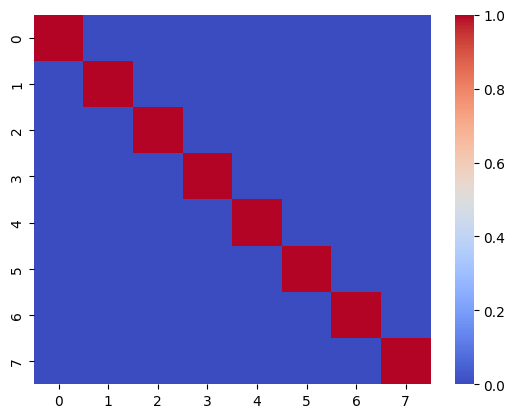

In [157]:
sns.heatmap(pd.DataFrame(df_temp_Proj).corr(), cmap='coolwarm');

### Variance cumulee expliquée

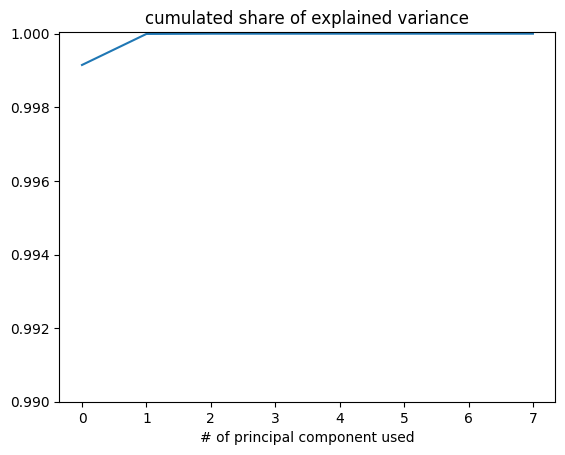

In [158]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.ylim(ymin=0.99)
plt.title('cumulated share of explained variance')
plt.xlabel('# of principal component used');


In [159]:
print("** avec n_components == 2, on explique deja 99% de la variance du dataset **\n" *3)

** avec n_components == 2, on explique deja 99% de la variance du dataset **
** avec n_components == 2, on explique deja 99% de la variance du dataset **
** avec n_components == 2, on explique deja 99% de la variance du dataset **



### Verification via Elbow method

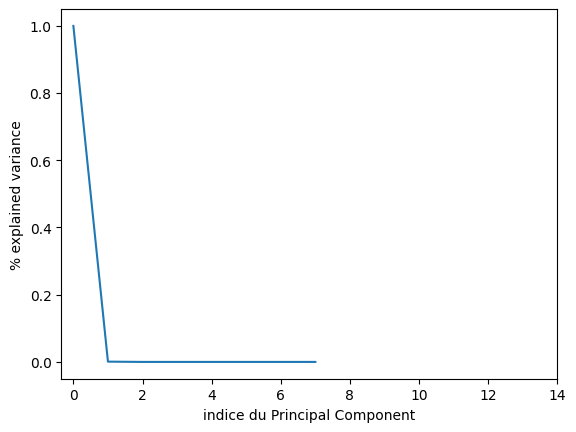

In [160]:
plt.plot(pca.explained_variance_ratio_)
plt.xlabel('indice du Principal Component')
plt.xticks(np.arange(0, 15, 2))
plt.ylabel('% explained variance');

In [161]:
print("Confirmation: avec PC0 et PC1, on est bien\n" *3)

Confirmation: avec PC0 et PC1, on est bien
Confirmation: avec PC0 et PC1, on est bien
Confirmation: avec PC0 et PC1, on est bien



In [162]:
# Variances (Percentage):
df_var_explained = pd.DataFrame(pca.explained_variance_ratio_)
df_var_explained = df_var_explained.rename(columns={0:"var_explained"})
df_var_explained  = round(df_var_explained * 100, 4)
df_var_explained

,var_explained
0,99.9150
1,0.0843
2,0.0007
3,0.0000
4,0.0000
5,0.0000
6,0.0000
7,0.0000


In [163]:
cum_var_explained = 0
index_pci_to_90 = 0
not_trigger = True
for i in df_var_explained.index:
    if cum_var_explained + df_var_explained.at[i, "var_explained"] < 90:
        cum_var_explained += df_var_explained.at[i, "var_explained"]
        index_pci_to_90 = i
    elif not_trigger:
        cum_var_explained += df_var_explained.at[i, "var_explained"]
        index_pci_to_90 = i
        not_trigger = False

cum_var_explained, index_pci_to_90

(99.915, 0)

## Exploration: Version avec PCA et vif_col

In [164]:
from sklearn.ensemble import VotingClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import StratifiedKFold, cross_validate
from sklearn.impute import SimpleImputer

# Explique au paragraphe precedent 
n_comp = 2

pipe_log = Pipeline([
    ("Inputer", SimpleImputer(strategy="mean")),
    ("scaler", StandardScaler()),
    ("pca", PCA(n_components=n_comp)),    
    ("lr", LogisticRegression(max_iter=1000))
])

# CV propre avec StratifiedKFold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# X_train = df_train_temp[col_shortl]    # Si on prends v, on est a 97.5% en accuraccy or on vet >= 0.98
X_train = df_train_temp[col_vif]
y_train = df_train_temp["houses"]

scores = cross_validate(
    pipe_log,
    X_train,
    y_train,
    cv=cv,
    # scoring=["accuracy", "precision", "recall", "f1"]  # A UTILISER SI SEULEMENT 2 CLASSES
    # scoring = ["accuracy", "precision_micro", "recall_micro", "f1_micro"]   # SINON et SI ON VEUT SCORES PAR CLASSE
    scoring = ["accuracy", "precision_macro", "recall_macro", "f1_macro"]   # SINON et SI ON VEUT SCORE AGREGES
)

# SINON et SI ON VEUT SCORE AGREGES
cv_scores = pd.DataFrame({
    "fold": range(1, cv.get_n_splits() + 1),
    "accuracy": scores["test_accuracy"],
    "precision": scores["test_precision_macro"],
    "recall": scores["test_recall_macro"],
    "f1": scores["test_f1_macro"]
})

cv_scores

,fold,accuracy,precision,recall,f1
0,1,0.965625,0.966036,0.962997,0.964435
1,2,0.943750,0.950001,0.944506,0.946992
2,3,0.975000,0.974735,0.973509,0.974041
3,4,0.965625,0.966429,0.965902,0.966153
4,5,0.962500,0.968879,0.958541,0.963075


In [165]:
pd.DataFrame(cv_scores.drop(columns=['fold']).mean(axis=0)).T

,accuracy,precision,recall,f1
0,0.9625,0.965216,0.961091,0.962939


In [166]:
print("Modele NON valide pour le moment car accuracy < 0.98\n"*3)

Modele NON valide pour le moment car accuracy < 0.98
Modele NON valide pour le moment car accuracy < 0.98
Modele NON valide pour le moment car accuracy < 0.98



### Grid_search pour atteindre 98% avec le PCA

In [167]:
# Explique au paragraphe precedent 
n_comp = 2

pipe_log_pca = Pipeline([
    ("Inputer", SimpleImputer(strategy="mean")),
    ("scaler", StandardScaler()),
    ("pca", PCA(n_components=n_comp)),
    ("lr", OneVsRestClassifier(LogisticRegression(solver="liblinear", max_iter=5000)))
])

cv = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

X_train = df_train_temp[col_vif]
y_train = df_train_temp["houses"]

param_grid = {
    "lr__estimator__penalty": ["l1", "l2"],
    "lr__estimator__C": [0.01, 0.015, 0.02, 0.025, 0.03, 0.05, 0.07, 0.1, 0.2, 0.5, 1]
}

grid_pca_lr = GridSearchCV(
    pipe_log_pca,
    param_grid,
    cv=cv,
    scoring="accuracy"
)

grid_pca_lr.fit(X_train, y_train)

print("Best params :", grid_pca_lr.best_params_)
print("Best accuracy :", grid_pca_lr.best_score_)

Best params : {'lr__estimator__C': 0.5, 'lr__estimator__penalty': 'l1'}
Best accuracy : 0.9674999999999999


In [168]:
print("Grid ne permet pas de monter au dessus de 0.98 (Remarque: 0.96 est deja tres bon)\n"*3)

Grid ne permet pas de monter au dessus de 0.98 (Remarque: 0.96 est deja tres bon)
Grid ne permet pas de monter au dessus de 0.98 (Remarque: 0.96 est deja tres bon)
Grid ne permet pas de monter au dessus de 0.98 (Remarque: 0.96 est deja tres bon)



In [169]:
print("On va essayer sans PCA\n"*3)

On va essayer sans PCA
On va essayer sans PCA
On va essayer sans PCA



## Version SANS PCA et vif_col

In [170]:
from sklearn.ensemble import VotingClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import StratifiedKFold, cross_validate
from sklearn.impute import SimpleImputer

# Explique au paragraphe precedent 
# n_comp = 2

pipe_log = Pipeline([
    ("Inputer", SimpleImputer(strategy="mean")),
    ("scaler", StandardScaler()),
    ("lr", OneVsRestClassifier(LogisticRegression(max_iter=1000)))
])

# CV propre avec StratifiedKFold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# X_train = df_train_temp[col_shortl]    # Si on prends v, on est a 97.5% en accuraccy or on vet >= 0.98
X_train = df_train_temp[col_vif]
y_train = df_train_temp["houses"]

scores = cross_validate(
    pipe_log,
    X_train,
    y_train,
    cv=cv,
    # scoring=["accuracy", "precision", "recall", "f1"]  # A UTILISER SI SEULEMENT 2 CLASSES
    # scoring = ["accuracy", "precision_micro", "recall_micro", "f1_micro"]   # SINON et SI ON VEUT SCORES PAR CLASSE
    scoring = ["accuracy", "precision_macro", "recall_macro", "f1_macro"]   # SINON et SI ON VEUT SCORE AGREGES
)

# SINON et SI ON VEUT SCORE AGREGES
cv_scores = pd.DataFrame({
    "fold": range(1, cv.get_n_splits() + 1),
    "accuracy": scores["test_accuracy"],
    "precision": scores["test_precision_macro"],
    "recall": scores["test_recall_macro"],
    "f1": scores["test_f1_macro"]
})

cv_scores

,fold,accuracy,precision,recall,f1
0,1,0.971875,0.973787,0.967759,0.970590
1,2,0.978125,0.979257,0.977806,0.978507
2,3,0.984375,0.983594,0.982523,0.983036
3,4,0.984375,0.988036,0.982275,0.984980
4,5,0.981250,0.983984,0.978702,0.981055


In [171]:
pd.DataFrame(cv_scores.drop(columns=['fold']).mean(axis=0)).T

,accuracy,precision,recall,f1
0,0.98,0.981732,0.977813,0.979634


In [172]:
print("On est en egal @ 0.98000001 pour le moment, risque de ne pas passer sur le dataset de test lorsqu'on aura les labels\n"*3)

On est en egal @ 0.98000001 pour le moment, risque de ne pas passer sur le dataset de test lorsqu'on aura les labels
On est en egal @ 0.98000001 pour le moment, risque de ne pas passer sur le dataset de test lorsqu'on aura les labels
On est en egal @ 0.98000001 pour le moment, risque de ne pas passer sur le dataset de test lorsqu'on aura les labels



In [173]:
print("Optimisation des hyper-param via grid pour avoir de meilleurs resultats\n"*3)

Optimisation des hyper-param via grid pour avoir de meilleurs resultats
Optimisation des hyper-param via grid pour avoir de meilleurs resultats
Optimisation des hyper-param via grid pour avoir de meilleurs resultats



### Grid_search pour atteindre 98% (sans PCA)

In [174]:
pipe_log = Pipeline([
    ("Inputer", SimpleImputer(strategy="mean")),
    ("scaler", StandardScaler()),
    #("lr", LogisticRegression(max_iter=1000, solver="liblinear"))
    ("lr", OneVsRestClassifier(LogisticRegression(solver="liblinear", max_iter=5000)))
])

# CV propre avec StratifiedKFold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# X_train = df_train_temp[col_shortl]    # Si on prends v, on est a 97.5% en accuraccy or on vet >= 0.98
X_train = df_train_temp[col_vif]
y_train = df_train_temp["houses"]

param_grid = {
    "lr__estimator__penalty": ["l1", "l2"],
    "lr__estimator__C": [0.005, 0.006, 0.007, 0.008, 0.009, 0.01, 0.015, 0.02, 0.025, 0.03, 0.035, 0.04, 0.05]
}

grid = GridSearchCV(
    pipe_log,
    param_grid,
    cv=cv,
    #scoring="accuracy"
    scoring = ["accuracy", "precision_macro", "recall_macro", "f1_macro"],
    refit="accuracy"
)

grid.fit(X_train, y_train)

print("Best params :", grid.best_params_)
print("Best accuracy :", grid.best_score_)

Best params : {'lr__estimator__C': 0.005, 'lr__estimator__penalty': 'l2'}
Best accuracy : 0.9818749999999999


In [175]:
df_grid = pd.DataFrame(grid.cv_results_)

df_grid[[
    "param_lr__estimator__C",
    "param_lr__estimator__penalty",
    "mean_test_accuracy",
    "std_test_accuracy",
    "mean_test_precision_macro",
    "mean_test_recall_macro",
    "mean_test_f1_macro"
]].sort_values(
    by=["mean_test_accuracy", "param_lr__estimator__C"],
    ascending=[False, True]
)

,param_lr__estimator__C,param_lr__estimator__penalty,mean_test_accuracy,std_test_accuracy,mean_test_precision_macro,mean_test_recall_macro,mean_test_f1_macro
1,0.005,l2,0.981875,0.005376,0.983123,0.980109,0.981509
3,0.006,l2,0.981875,0.005376,0.983123,0.980109,0.981509
5,0.007,l2,0.981875,0.005376,0.983123,0.980109,0.981509
7,0.008,l2,0.981875,0.005376,0.983123,0.980109,0.981509
9,0.009,l2,0.981875,0.005376,0.983123,0.980109,0.981509
11,0.010,l2,0.981875,0.005376,0.983123,0.980109,0.981509
13,0.015,l2,0.981875,0.005376,0.983123,0.980109,0.981509
15,0.020,l2,0.981875,0.005376,0.983123,0.980109,0.981509
17,0.025,l2,0.981875,0.005376,0.983123,0.980109,0.981509
19,0.030,l2,0.981875,0.005376,0.983123,0.980109,0.981509


In [176]:
print("On obtient une plage stable ou tous les Ridge entre [0.003 et 0.05] AVEC L2 donnent une accuracy > 0.98% accuracy, donc stabilité'\n"*3)

On obtient une plage stable ou tous les Ridge entre [0.003 et 0.05] AVEC L2 donnent une accuracy > 0.98% accuracy, donc stabilité'
On obtient une plage stable ou tous les Ridge entre [0.003 et 0.05] AVEC L2 donnent une accuracy > 0.98% accuracy, donc stabilité'
On obtient une plage stable ou tous les Ridge entre [0.003 et 0.05] AVEC L2 donnent une accuracy > 0.98% accuracy, donc stabilité'



In [177]:
print("Rappel : si trop de regularisation cad en L2, si C->0, alors risque d'underfitting (coeff ramenés @ 0, si C trop grand, overfitting donc arbitrairement\n" *3)

Rappel : si trop de regularisation cad en L2, si C->0, alors risque d'underfitting (coeff ramenés @ 0, si C trop grand, overfitting donc arbitrairement
Rappel : si trop de regularisation cad en L2, si C->0, alors risque d'underfitting (coeff ramenés @ 0, si C trop grand, overfitting donc arbitrairement
Rappel : si trop de regularisation cad en L2, si C->0, alors risque d'underfitting (coeff ramenés @ 0, si C trop grand, overfitting donc arbitrairement



In [178]:
print("donc arbitrairement, on va prendre un C a l'interieur des bornes : C= 0.02 \n" *3)

donc arbitrairement, on va prendre un C a l'interieur des bornes : C= 0.02 
donc arbitrairement, on va prendre un C a l'interieur des bornes : C= 0.02 
donc arbitrairement, on va prendre un C a l'interieur des bornes : C= 0.02 



In [179]:
print("Pourquoi: Plusieurs C donnent exactement la meme accuracy en CV. C=0.02, est dans la zone stable.\n"*3)

Pourquoi: Plusieurs C donnent exactement la meme accuracy en CV. C=0.02, est dans la zone stable.
Pourquoi: Plusieurs C donnent exactement la meme accuracy en CV. C=0.02, est dans la zone stable.
Pourquoi: Plusieurs C donnent exactement la meme accuracy en CV. C=0.02, est dans la zone stable.



In [180]:
print("CQFD\n"*3)

CQFD
CQFD
CQFD



## Entrainement sur toute la data + sauvegarde du model

In [181]:
# LogisticRegression(penalty='l2', C=1.0, random_state=None)

In [182]:
#col_vif_without_OneHot

#col_vif_onehot = ['Best Hand_Right']
#col_vif_to_onehot = ["Best Hand"]


In [183]:
df_train = pd.read_csv('datasets/dataset_train.csv', sep = ',', header=0).drop(columns=['Index'])
df_train.columns

Index(['Hogwarts House', 'First Name', 'Last Name', 'Birthday', 'Best Hand',
       'Arithmancy', 'Astronomy', 'Herbology', 'Defense Against the Dark Arts',
       'Divination', 'Muggle Studies', 'Ancient Runes', 'History of Magic',
       'Transfiguration', 'Potions', 'Care of Magical Creatures', 'Charms',
       'Flying'],
      dtype='object')

In [184]:
# col_num + col_cat les colonnes retenues pas le VIF

col_num = [
    "Arithmancy",
    "Defense Against the Dark Arts",
    "Divination",
    "Muggle Studies",
    "History of Magic",
    "Transfiguration",
    "Potions",
    "Care of Magical Creatures"
]

col_cat = ["Best Hand"]

In [185]:
preprocessor = ColumnTransformer([
    ("num", Pipeline([
        ("imputer", SimpleImputer(strategy="mean")),
        ("scaler", StandardScaler())
    ]), col_num),

    ("cat", OneHotEncoder(
        handle_unknown="ignore",
        drop="first",
        sparse_output=False
    ), col_cat)
])

pipe_log = Pipeline([
    ("preprocessor", preprocessor),
    ("lr", OneVsRestClassifier(LogisticRegression(
        max_iter=1000,
        solver="liblinear",
        C=0.02
    )))
])

X_train = df_train[col_num + col_cat]
y_train = df_train["Hogwarts House"]

model_logreg = pipe_log.fit(X_train, y_train)
model_logreg

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Arithmancy',
                                                   'Defense Against the Dark '
                                                   'Arts',
                                                   'Divination',
                                                   'Muggle Studies',
                                                   'History of Magic',
                                                   'Transfiguration', 'Potions',
                                                   'Care of Magical '
                                                   'Creatures']),
                                                 ('cat',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['Best Hand'])])),
                ('lr',
                 OneVsRestClassifier(estimator=LogisticRegression(C=0.02,
                                                                  max_iter=1000,
                                                                  solver='liblinear')))])

###  Sauvegarde du modèle

In [186]:
import joblib

joblib.dump(model_logreg, "model_logreg.pkl")

['model_logreg.pkl']

### Chargement du modele

In [187]:
loaded_logreg = joblib.load("model_logreg.pkl")

## Evaluation du modele sur le test

In [188]:
df_test = pd.read_csv('datasets/dataset_test.csv', sep = ',', header=0).drop(columns=['Index'])
df_test.head()

,Hogwarts House,First Name,Last Name,Birthday,Best Hand,Arithmancy,Astronomy,Herbology,Defense Against the Dark Arts,Divination,Muggle Studies,Ancient Runes,History of Magic,Transfiguration,Potions,Care of Magical Creatures,Charms,Flying
0,NaN,Rico,Sargent,2001-10-06,Right,41642.0,696.096071,3.020172,-6.960961,7.996,-365.151850,393.138185,4.207691,1046.742736,3.668983,0.373853,-244.48172,-13.62
1,NaN,Tamara,Shackelford,1998-01-08,Left,45352.0,-370.844655,2.965226,3.708447,6.349,522.580486,602.853051,6.460017,1048.053878,8.514622,0.577432,-231.29200,-26.26
2,NaN,Staci,Crandall,1998-09-15,Left,43502.0,320.303990,-6.185697,-3.203040,4.619,-630.073207,588.071795,-5.565818,936.437358,1.850829,-1.647150,-252.99343,200.15
3,NaN,Dee,Gavin,2001-05-10,Right,61831.0,407.202928,4.962442,NaN,NaN,-449.179806,427.699966,NaN,1043.397718,4.656573,1.164708,-244.01660,-11.15
4,NaN,Gregory,Gustafson,1999-02-01,Right,NaN,288.337747,3.737656,-2.883377,4.886,-449.732166,385.712782,2.876347,1051.377936,2.750586,0.102104,-243.99806,-7.12


In [189]:
(df_test.isnull().sum() / len(df_test)).sort_values(ascending=False)

Hogwarts House                   1.0000
Arithmancy                       0.0325
Astronomy                        0.0325
Transfiguration                  0.0275
Herbology                        0.0275
History of Magic                 0.0275
Potions                          0.0250
Muggle Studies                   0.0250
Ancient Runes                    0.0200
Care of Magical Creatures        0.0200
Defense Against the Dark Arts    0.0200
Divination                       0.0150
First Name                       0.0000
Best Hand                        0.0000
Birthday                         0.0000
Last Name                        0.0000
Charms                           0.0000
Flying                           0.0000
dtype: float64

In [190]:
X_test = df_test[col_num + col_cat]

y_pred = loaded_logreg.predict(X_test)
y_pred

array(['Hufflepuff', 'Ravenclaw', 'Gryffindor', 'Hufflepuff',
       'Hufflepuff', 'Slytherin', 'Ravenclaw', 'Hufflepuff', 'Ravenclaw',
       'Hufflepuff', 'Hufflepuff', 'Slytherin', 'Slytherin', 'Slytherin',
       'Slytherin', 'Hufflepuff', 'Ravenclaw', 'Slytherin', 'Ravenclaw',
       'Hufflepuff', 'Hufflepuff', 'Slytherin', 'Ravenclaw', 'Ravenclaw',
       'Hufflepuff', 'Hufflepuff', 'Ravenclaw', 'Slytherin', 'Gryffindor',
       'Ravenclaw', 'Hufflepuff', 'Hufflepuff', 'Gryffindor',
       'Hufflepuff', 'Hufflepuff', 'Ravenclaw', 'Gryffindor', 'Ravenclaw',
       'Slytherin', 'Ravenclaw', 'Ravenclaw', 'Slytherin', 'Hufflepuff',
       'Slytherin', 'Hufflepuff', 'Ravenclaw', 'Slytherin', 'Gryffindor',
       'Ravenclaw', 'Slytherin', 'Ravenclaw', 'Hufflepuff', 'Ravenclaw',
       'Ravenclaw', 'Hufflepuff', 'Slytherin', 'Slytherin', 'Ravenclaw',
       'Hufflepuff', 'Gryffindor', 'Gryffindor', 'Gryffindor',
       'Hufflepuff', 'Hufflepuff', 'Ravenclaw', 'Hufflepuff',
       'Huffl

In [191]:
df_preds = pd.DataFrame(y_pred, columns=["Hogwarts House"])
df_preds.reset_index(inplace=True)
df_preds.rename(columns={"index": "Index"}, inplace=True)
df_preds

,Index,Hogwarts House
0,0,Hufflepuff
1,1,Ravenclaw
2,2,Gryffindor
3,3,Hufflepuff
4,4,Hufflepuff
...,...,...
395,395,Slytherin
396,396,Hufflepuff
397,397,Hufflepuff
398,398,Ravenclaw


In [192]:
df_preds[["Index", "Hogwarts House"]].to_csv("houses_interdit.csv", header=True, index=False)

In [193]:
print("CQFD\n" *3)

CQFD
CQFD
CQFD

